Group 4 Project

- all the below datasets can be downloaded from the world bank site and also added the zip file of datasets.


-Mahesh Polisetty
-Rahul Belede
-Pavan Vasamsetti
-Vyshnavi Anakalla
-Kartheek Gurijala
-Hari Rachuri


In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load datasets
cpi_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\Consumer price index (2010 = 100).csv")
energy_use_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\Energy use (kg of oil equivalent per capita).csv")
exports_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\Exports of goods and services (% of GDP).csv")
gdp_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\GDP (current US$).csv")
gov_consumption_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\General government final consumption expenditure (% of GDP).csv")
oil_rents_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\Oil rents (% of GDP).csv")
unemployment_df = pd.read_csv(r"C:\Users\Mahes\OneDrive\Desktop\Sem 4\Data Mining\project_datasets\Unemployment, total (% of total labor force) (modeled ILO estimate).csv")



In [2]:
cpi_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,102.912772,103.401365,102.438495,101.385139,105.061406,109.534355,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,133.768367,132.883209,138.708665,145.610741,146.522482,149.895975,NaN,NaN,NaN,NaN
3,Africa Western and Central,AFW,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,146.042056,159.705711,208.726444,271.019766,324.218068,379.597607,464.139837,583.675779,708.321436,804.965533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,112.418996,111.815385,112.120830,113.789451,114.988562,118.065646,118.299685,122.267092,136.426245,143.171469
262,"Yemen, Rep.",YEM,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,157.583340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,Consumer price index (2010 = 100),FP.CPI.TOTL,1.77246,1.809723,1.832278,1.856793,1.903862,1.981331,...,124.629820,130.288814,138.850608,146.048966,152.646240,158.935640,164.037531,171.602404,183.682745,194.839466
264,Zambia,ZMB,Consumer price index (2010 = 100),FP.CPI.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,130.815808,144.042061,169.781989,180.949079,194.510438,212.308759,245.711424,299.818966,332.778677,369.000077


In [3]:
energy_use_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,734.218297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Africa Western and Central,AFW,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,602.378095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,540.864116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,1219.326655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,2686.376196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264,Zambia,ZMB,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
exports_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,78.275494,72.852913,71.820435,72.548690,72.252774,73.234592,55.326810,69.069709,83.124605,NaN
1,Africa Eastern and Southern,AFE,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,28.572586,24.046024,23.249929,23.824897,25.315921,23.903124,22.036160,25.922406,27.595354,24.503160
2,Afghanistan,AFG,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,10.420817,14.342153,18.380042,NaN
3,Africa Western and Central,AFW,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,44.695029,29.754598,28.124485,29.004102,40.836290,40.790755,38.314541,47.745276,44.399617,39.872673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,23.526885,22.451393,23.827405,27.328845,29.053465,29.312607,21.695147,33.409183,38.625657,39.746508
262,"Yemen, Rep.",YEM,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,21.484087,9.051578,4.809195,9.688218,8.755597,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,25.588094,25.341426,25.463623,24.841997,23.805621,22.292448,...,29.000619,27.713638,28.156088,27.340076,27.497037,27.202129,27.527351,31.111320,33.538446,33.023118
264,Zambia,ZMB,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,38.822290,37.138526,35.324676,34.992858,37.957405,34.636193,46.720186,52.216090,40.193998,40.775224


In [5]:
gdp_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,2.790850e+09,2.962907e+09,2.983635e+09,3.092429e+09,3.276184e+09,3.395799e+09,2.558906e+09,3.103184e+09,3.544708e+09,NaN
1,Africa Eastern and Southern,AFE,GDP (current US$),NY.GDP.MKTP.CD,2.121696e+10,2.230747e+10,2.370247e+10,2.577938e+10,2.804954e+10,3.037491e+10,...,9.796900e+11,8.992960e+11,8.298300e+11,9.401050e+11,1.012720e+12,1.006530e+12,9.290740e+11,1.086770e+12,1.183960e+12,1.236160e+12
2,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,2.049713e+10,1.913422e+10,1.811657e+10,1.875346e+10,1.805322e+10,1.879944e+10,1.995593e+10,1.426650e+10,1.450216e+10,NaN
3,Africa Western and Central,AFW,GDP (current US$),NY.GDP.MKTP.CD,1.188413e+10,1.268566e+10,1.360683e+10,1.443998e+10,1.576911e+10,1.693448e+10,...,8.945850e+11,7.693670e+11,6.921810e+11,6.857500e+11,7.681900e+11,8.239340e+11,7.871470e+11,8.459930e+11,8.771410e+11,7.965860e+11
4,Angola,AGO,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,1.359670e+11,9.049642e+10,5.276162e+10,7.369015e+10,7.945069e+10,7.089796e+10,4.850156e+10,6.650513e+10,1.044000e+11,8.472296e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,7.074395e+09,6.295848e+09,6.682677e+09,7.180765e+09,7.878760e+09,7.899738e+09,7.717145e+09,9.413404e+09,9.354903e+09,1.043835e+10
262,"Yemen, Rep.",YEM,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,4.322859e+10,4.244449e+10,3.131783e+10,2.684223e+10,2.160616e+10,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,GDP (current US$),NY.GDP.MKTP.CD,8.748597e+09,9.225996e+09,9.813996e+09,1.085420e+10,1.195600e+10,1.306899e+10,...,3.811990e+11,3.467100e+11,3.235860e+11,3.814490e+11,4.052610e+11,3.893300e+11,3.382910e+11,4.201180e+11,4.052710e+11,3.777820e+11
264,Zambia,ZMB,GDP (current US$),NY.GDP.MKTP.CD,7.130000e+08,6.962857e+08,6.931429e+08,7.187143e+08,8.394286e+08,1.082857e+09,...,2.714102e+10,2.125122e+10,2.095841e+10,2.587360e+10,2.631151e+10,2.330867e+10,1.813776e+10,2.209642e+10,2.916378e+10,2.816263e+10


In [6]:
gov_consumption_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,24.823741,23.255696,23.487527,23.021624,23.071020,22.498552,27.466134,21.848676,19.903168,NaN
1,Africa Eastern and Southern,AFE,General government final consumption expenditu...,NE.CON.GOVT.ZS,6.828244,7.183119,7.775211,7.647968,8.187570,8.454828,...,15.992689,15.447154,15.387360,15.392948,14.858673,14.630072,15.175598,14.724318,14.376139,13.972241
2,Afghanistan,AFG,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,22.109219,21.262384,21.845492,NaN
3,Africa Western and Central,AFW,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,17.975659,16.432833,13.880685,12.935819,10.474544,8.598856,8.774083,7.705831,7.760268,6.361533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,13.587119,13.608097,12.084814,11.822956,12.102593,12.485438,13.913177,12.872331,11.791729,12.537431
262,"Yemen, Rep.",YEM,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,12.186052,10.795498,8.795800,6.106127,9.144463,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,General government final consumption expenditu...,NE.CON.GOVT.ZS,8.081293,8.361153,9.243937,8.886882,9.730679,9.941082,...,19.314063,18.985071,19.307562,19.236077,19.352226,19.580080,20.574894,19.351323,19.146875,19.707424
264,Zambia,ZMB,General government final consumption expenditu...,NE.CON.GOVT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,14.523894,14.780593,16.071874,13.720795,12.708663,17.684249,14.689642,11.531032,14.323302,NaN


In [7]:
oil_rents_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,734.218297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Africa Western and Central,AFW,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,602.378095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,540.864116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,1219.326655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
263,South Africa,ZAF,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,2686.376196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264,Zambia,ZMB,Energy use (kg of oil equivalent per capita),EG.USE.PCAP.KG.OE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
unemployment_df

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,6.79081,6.880312,7.027630,7.123032,7.068440,7.244670,7.661161,7.964493,7.448222,7.472824
2,Afghanistan,AFG,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,7.91500,9.011000,10.100000,11.184000,11.206000,11.224000,11.710000,11.934000,14.100000,14.386000
3,Africa Western and Central,AFW,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,3.89955,4.204562,4.139948,4.204170,4.224167,4.247944,4.697497,4.524016,3.737766,3.397782
4,Angola,AGO,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,16.40100,16.491000,16.580000,16.617000,16.599000,16.497000,16.676000,15.799000,14.693000,14.620000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,13.46700,17.900000,18.382000,18.564000,17.644000,17.303000,17.972000,18.248000,17.515000,17.215000
263,South Africa,ZAF,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,22.60600,22.869000,24.023000,23.992000,24.218000,25.538000,24.339000,28.770000,28.838000,27.988000
264,Zambia,ZMB,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,8.13100,8.316000,8.418000,8.518000,5.031000,5.539000,6.032000,5.195000,5.993000,5.913000


In [9]:
def reshape_data(df, indicator_name):
    # Drop unnecessary columns and reshape data
    df_long = df.melt(id_vars=['Country Name', 'Country Code'], var_name='Year', value_name=indicator_name)
    df_long['Year'] = pd.to_numeric(df_long['Year'], errors='coerce')
    return df_long

# Reshape each dataset
cpi_df_long = reshape_data(cpi_df, 'CPI')
energy_use_df_long = reshape_data(energy_use_df, 'Energy_Use')
exports_df_long = reshape_data(exports_df, 'Exports')
gdp_df_long = reshape_data(gdp_df, 'GDP')
gov_consumption_df_long = reshape_data(gov_consumption_df, 'Gov_Consumption')
oil_rents_df_long = reshape_data(oil_rents_df, 'Oil_Rents')
unemployment_df_long = reshape_data(unemployment_df, 'Unemployment')


In [10]:
# Merge datasets on 'Country Code' and 'Year'
merged_df = gdp_df_long.copy()
for df in [cpi_df_long, energy_use_df_long, exports_df_long, gov_consumption_df_long, oil_rents_df_long, unemployment_df_long]:
    merged_df = merged_df.merge(df, on=['Country Name', 'Country Code', 'Year'], how='left')


In [11]:
# Convert columns to numeric types where possible, ignoring non-numeric columns
for col in merged_df.select_dtypes(include=['object']).columns:
    if col not in ['Country Name', 'Country Code']:  # Exclude non-numeric columns
        merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

# Now, we can interpolate numeric columns without triggering warnings
merged_df = merged_df.interpolate(method='linear', limit_direction='forward', axis=0)
merged_df = merged_df.bfill().ffill()  # backfill and forward-fill to handle any remaining NaNs


C:\Users\Mahes\AppData\Local\Temp\ipykernel_7268\3184543090.py:7: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  merged_df = merged_df.interpolate(method='linear', limit_direction='forward', axis=0)


In [12]:
# Display first few rows or save the cleaned dataset for further analysis
print(merged_df.head())
# Optionally save to CSV for future use
merged_df.to_csv('cleaned_gdp_data.csv', index=False)



  Country Name Country Code    Year           GDP       CPI   Energy_Use  \
0        Aruba          ABW  1960.0  2.121696e+10  7.960458  3063.554271   
1        Aruba          ABW  1960.0  2.121696e+10  7.960458  3063.554271   
2        Aruba          ABW  1960.0  2.121696e+10  7.960458  3063.554271   
3        Aruba          ABW  1960.0  2.121696e+10  7.960458  3063.554271   
4        Aruba          ABW  1960.0  2.121696e+10  7.960458  3063.554271   

    Exports  Gov_Consumption    Oil_Rents  Unemployment  
0  7.604049         6.828244  3063.554271      7.710275  
1  7.604049         6.828244  3063.554271      7.710275  
2  7.604049         6.828244  3063.554271      7.710275  
3  7.604049         6.828244  3063.554271      7.710275  
4  7.604049         6.828244  3063.554271      7.710275  


In [13]:
merged_df

,Country Name,Country Code,Year,GDP,CPI,Energy_Use,Exports,Gov_Consumption,Oil_Rents,Unemployment
0,Aruba,ABW,1960.0,2.121696e+10,7.960458,3063.554271,7.604049,6.828244,3063.554271,7.710275
1,Aruba,ABW,1960.0,2.121696e+10,7.960458,3063.554271,7.604049,6.828244,3063.554271,7.710275
2,Aruba,ABW,1960.0,2.121696e+10,7.960458,3063.554271,7.604049,6.828244,3063.554271,7.710275
3,Aruba,ABW,1960.0,2.121696e+10,7.960458,3063.554271,7.604049,6.828244,3063.554271,7.710275
4,Aruba,ABW,1960.0,2.121696e+10,7.960458,3063.554271,7.604049,6.828244,3063.554271,7.710275
...,...,...,...,...,...,...,...,...,...,...
51067,Kosovo,XKX,2023.0,1.043835e+10,143.171469,6803.996607,39.746508,12.537431,6803.996607,13.481000
51068,"Yemen, Rep.",YEM,2023.0,1.941102e+11,169.005468,6803.996607,36.384813,16.122427,6803.996607,17.215000
51069,South Africa,ZAF,2023.0,3.777820e+11,194.839466,6803.996607,33.023118,19.707424,6803.996607,27.988000
51070,Zambia,ZMB,2023.0,2.816263e+10,369.000077,6803.996607,40.775224,19.707424,6803.996607,5.913000


Visualizations

In [14]:
import matplotlib.pyplot as plt
import plotly.express as px

# List of top 20 powerful countries
top_20_countries = [
    'United States', 'China', 'Japan', 'Germany', 'United Kingdom',
    'India', 'France', 'Brazil', 'Italy', 'Canada', 'South Korea',
    'Russia', 'Australia', 'Spain', 'Mexico', 'Indonesia', 'Turkey',
    'Saudi Arabia', 'Switzerland', 'Netherlands'
]

# Filter dataset for these countries
top_20_gdp = merged_df[merged_df['Country Name'].isin(top_20_countries)]



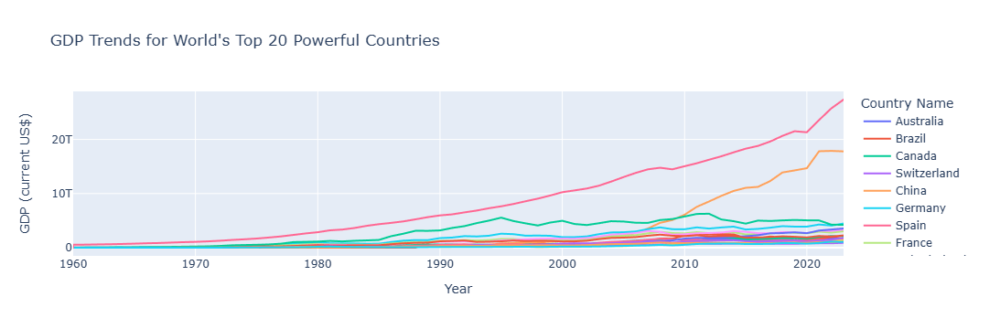

In [15]:
import plotly.express as px

# Line plot for GDP trends over the years
fig = px.line(
    top_20_gdp,
    x='Year',
    y='GDP',
    color='Country Name',
    title='GDP Trends for World\'s Top 20 Powerful Countries',
    labels={'GDP': 'GDP (current US$)', 'Year': 'Year'}
)
fig.show()


C:\Users\Mahes\AppData\Local\Temp\ipykernel_7268\1521776812.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



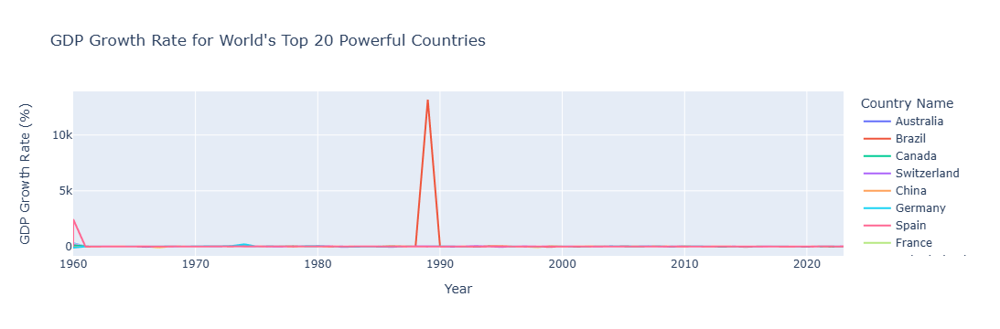

In [16]:
# Calculate GDP Growth Rate using .loc to avoid SettingWithCopyWarning
top_20_gdp.loc[:, 'GDP Growth Rate'] = top_20_gdp.groupby('Country Name')['GDP'].pct_change() * 100


fig_growth = px.line(
    top_20_gdp,
    x='Year',
    y='GDP Growth Rate',
    color='Country Name',
    title='GDP Growth Rate for World\'s Top 20 Powerful Countries',
    labels={'GDP Growth Rate': 'GDP Growth Rate (%)', 'Year': 'Year'}
)
fig_growth.show()


C:\Users\Mahes\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning:

Blowfish has been deprecated



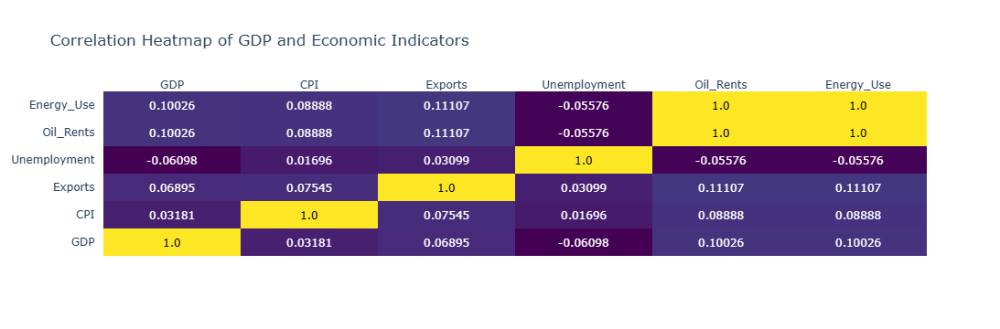

In [17]:
import plotly.figure_factory as ff
import numpy as np


# Assuming merged_df is your main DataFrame with all relevant economic indicators
correlation_data = merged_df[['GDP', 'CPI', 'Exports', 'Unemployment', 'Oil_Rents', 'Energy_Use']]  # Replace with relevant columns
# Compute the correlation matrix
correlation_matrix = correlation_data.corr()

# Format the values to 5 decimal places
z_text = np.round(correlation_matrix.values, 5).astype(str)

# Create the annotated heatmap with formatted values
fig_corr = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns.tolist(),
    y=correlation_matrix.columns.tolist(),
    annotation_text=z_text,
    colorscale='Viridis'
)

# Add a title using the layout
fig_corr.update_layout(
    title="Correlation Heatmap of GDP and Economic Indicators"
)

# Show the heatmap
fig_corr.show()


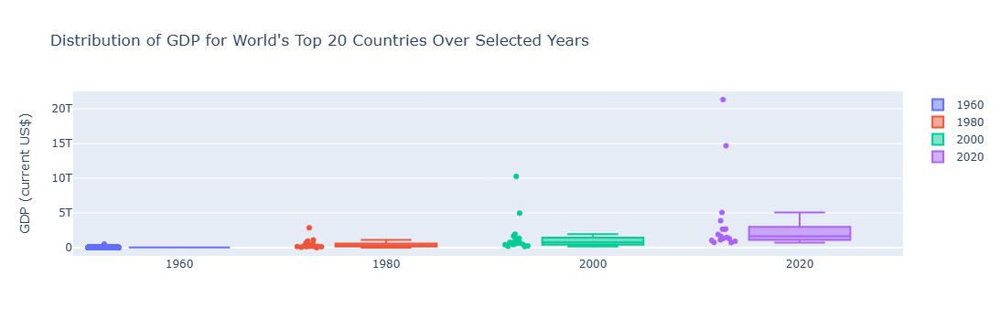

In [18]:
import plotly.graph_objects as go

# Filter data for every 5 years
years_to_plot = [1960, 1980, 2000, 2020]
gdp_distribution = top_20_gdp[top_20_gdp['Year'].isin(years_to_plot)]

fig_dist = go.Figure()

for year in years_to_plot:
    fig_dist.add_trace(go.Box(
        y=gdp_distribution[gdp_distribution['Year'] == year]['GDP'],
        name=str(year),
        boxpoints='all'
    ))

fig_dist.update_layout(
    title="Distribution of GDP for World's Top 20 Countries Over Selected Years",
    yaxis_title="GDP (current US$)"
)
fig_dist.show()


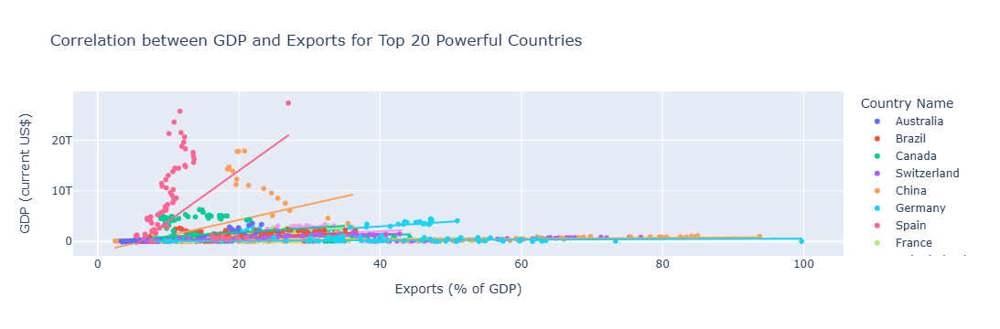

In [19]:
import plotly.express as px

# Extract GDP and Exports columns along with Year and Country Name for the top 20 powerful countries
gdp_exports_df = top_20_gdp[['Country Name', 'Year', 'GDP', 'Exports']].dropna()

# Scatter plot with trend line to visualize correlation between GDP and Exports
fig_corr_gdp_exports = px.scatter(
    gdp_exports_df,
    x='Exports',
    y='GDP',
    color='Country Name',
    trendline='ols',
    title='Correlation between GDP and Exports for Top 20 Powerful Countries',
    labels={'Exports': 'Exports (% of GDP)', 'GDP': 'GDP (current US$)'}
)

fig_corr_gdp_exports.show()


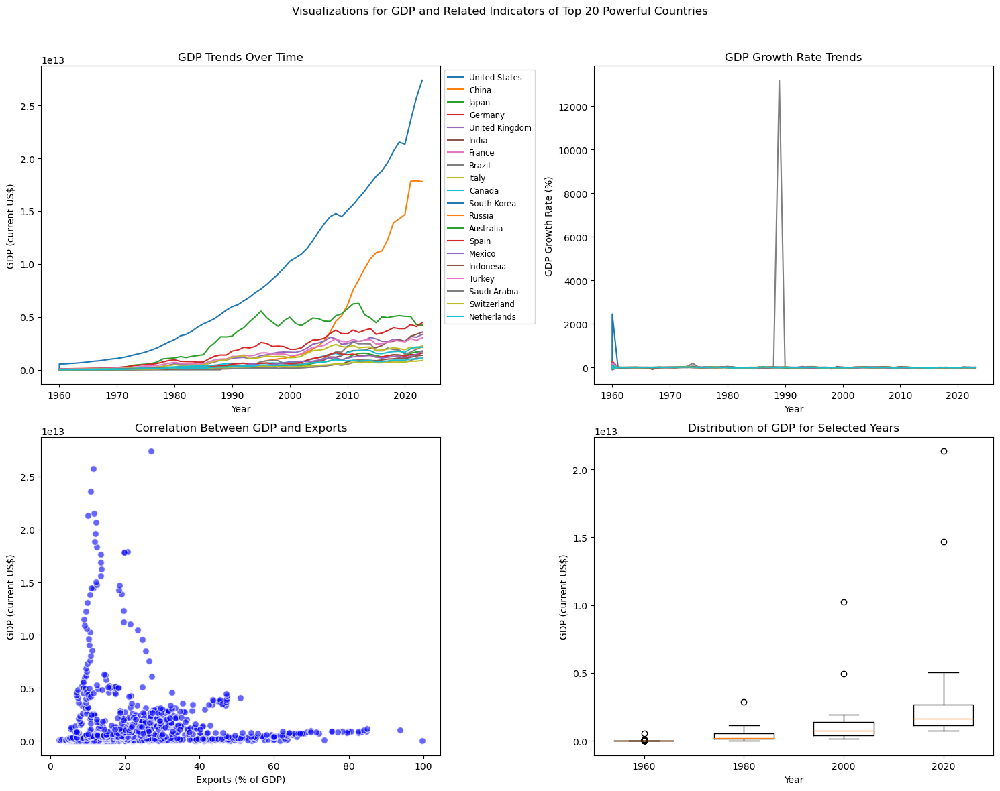

In [20]:
import matplotlib.pyplot as plt

# Redefine necessary datasets and filters
# Assuming that 'merged_df' exists in the environment after data merging
top_20_countries = [
    'United States', 'China', 'Japan', 'Germany', 'United Kingdom',
    'India', 'France', 'Brazil', 'Italy', 'Canada', 'South Korea',
    'Russia', 'Australia', 'Spain', 'Mexico', 'Indonesia', 'Turkey',
    'Saudi Arabia', 'Switzerland', 'Netherlands'
]
# Filter the merged dataset for these countries and relevant columns
top_20_gdp = merged_df[merged_df['Country Name'].isin(top_20_countries)].dropna(subset=['GDP', 'Exports'])

# Set up subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle("Visualizations for GDP and Related Indicators of Top 20 Powerful Countries")

# GDP Trends Over Time for Top 20 Countries
for country in top_20_countries:
    country_data = top_20_gdp[top_20_gdp['Country Name'] == country]
    axs[0, 0].plot(country_data['Year'], country_data['GDP'], label=country)

axs[0, 0].set_title("GDP Trends Over Time")
axs[0, 0].set_xlabel("Year")
axs[0, 0].set_ylabel("GDP (current US$)")
axs[0, 0].legend(loc="upper left", fontsize="small", bbox_to_anchor=(1, 1))

# GDP Growth Rate Trends
top_20_gdp['GDP Growth Rate'] = top_20_gdp.groupby('Country Name')['GDP'].pct_change() * 100
for country in top_20_countries:
    country_data = top_20_gdp[top_20_gdp['Country Name'] == country]
    axs[0, 1].plot(country_data['Year'], country_data['GDP Growth Rate'], label=country)

axs[0, 1].set_title("GDP Growth Rate Trends")
axs[0, 1].set_xlabel("Year")
axs[0, 1].set_ylabel("GDP Growth Rate (%)")

# Correlation Between GDP and Exports
axs[1, 0].scatter(top_20_gdp['Exports'], top_20_gdp['GDP'], c='blue', alpha=0.6, edgecolors='w', s=50)
axs[1, 0].set_title("Correlation Between GDP and Exports")
axs[1, 0].set_xlabel("Exports (% of GDP)")
axs[1, 0].set_ylabel("GDP (current US$)")

# Distribution of GDP over Time (for Selected Years)
selected_years = [1960, 1980, 2000, 2020]
for year in selected_years:
    year_data = top_20_gdp[top_20_gdp['Year'] == year]['GDP']
    axs[1, 1].boxplot(year_data.dropna(), positions=[selected_years.index(year)], widths=0.6)

axs[1, 1].set_xticklabels(selected_years)
axs[1, 1].set_title("Distribution of GDP for Selected Years")
axs[1, 1].set_ylabel("GDP (current US$)")
axs[1, 1].set_xlabel("Year")

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title
plt.show()


In [21]:
# Import necessary libraries for feature engineering and model preparation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Prepare and clean data for all countries, including lagged features
# This will allow us to use data from all countries to improve model generalizability
# Assuming the dataframes are already loaded
merged_df_cleaned = merged_df.dropna()  

# Re-define selected features and target
selected_features = ['CPI', 'Energy_Use', 'Exports', 'Gov_Consumption', 'Oil_Rents', 'Unemployment']
target = 'GDP'

# Sort data by Country and Year for time-series consistency
merged_df_cleaned = merged_df_cleaned.sort_values(by=['Country Name', 'Year'])

# Step 1: Create lagged features for each of the selected features and the target
for feature in selected_features + [target]:
    for lag in range(1, 4):  # 3 years of lagged data as features
        merged_df_cleaned[f'{feature}_lag_{lag}'] = merged_df_cleaned.groupby('Country Name')[feature].shift(lag)

# Drop rows with NaNs resulting from lagging
merged_df_cleaned = merged_df_cleaned.dropna()

# Step 2: Define the input features and target
X_all = merged_df_cleaned[[f'{feature}_lag_{lag}' for feature in selected_features + [target] for lag in range(1, 4)]]
y_all = merged_df_cleaned[target]

# Step 3: Train-test split for the entire dataset based on a time-based split
train_size = int(0.8 * len(merged_df_cleaned))
X_train_all, X_test_all = X_all[:train_size], X_all[train_size:]
y_train_all, y_test_all = y_all[:train_size], y_all[train_size:]

# Step 4: Scale the data to standardize the ranges of features
scaler = StandardScaler()
X_train_all_scaled = scaler.fit_transform(X_train_all)
X_test_all_scaled = scaler.transform(X_test_all)

# Display the first few rows of the prepared training data for verification
X_train_all_scaled[:5], y_train_all.head()


(array([[-0.28967373, -0.35613182, -0.38693514,  0.01407952,  0.02638793,
          0.03905783, -0.46294914, -0.4585261 , -0.45469911, -0.53710535,
         -0.53127417, -0.52566949,  0.01407952,  0.02638793,  0.03905783,
         -0.00950833, -0.01154716, -0.01172866, -0.1214735 , -0.12001803,
         -0.11860997],
        [-0.28967373, -0.35613182, -0.38693514,  0.01407952,  0.02638793,
          0.03905783, -0.46294914, -0.4585261 , -0.45469911, -0.53710535,
         -0.53127417, -0.52566949,  0.01407952,  0.02638793,  0.03905783,
         -0.00950833, -0.01154716, -0.01172866, -0.1214735 , -0.12001803,
         -0.11860997],
        [-0.28967373, -0.35613182, -0.38693514,  0.01407952,  0.02638793,
          0.03905783, -0.46294914, -0.4585261 , -0.45469911, -0.53710535,
         -0.53127417, -0.52566949,  0.01407952,  0.02638793,  0.03905783,
         -0.00950833, -0.01154716, -0.01172866, -0.1214735 , -0.12001803,
         -0.11860997],
        [-0.28967373, -0.35613182, -0.38693

*STOP*

Skipping South Korea due to insufficient data
Skipping Russia due to insufficient data
Skipping Turkey due to insufficient data


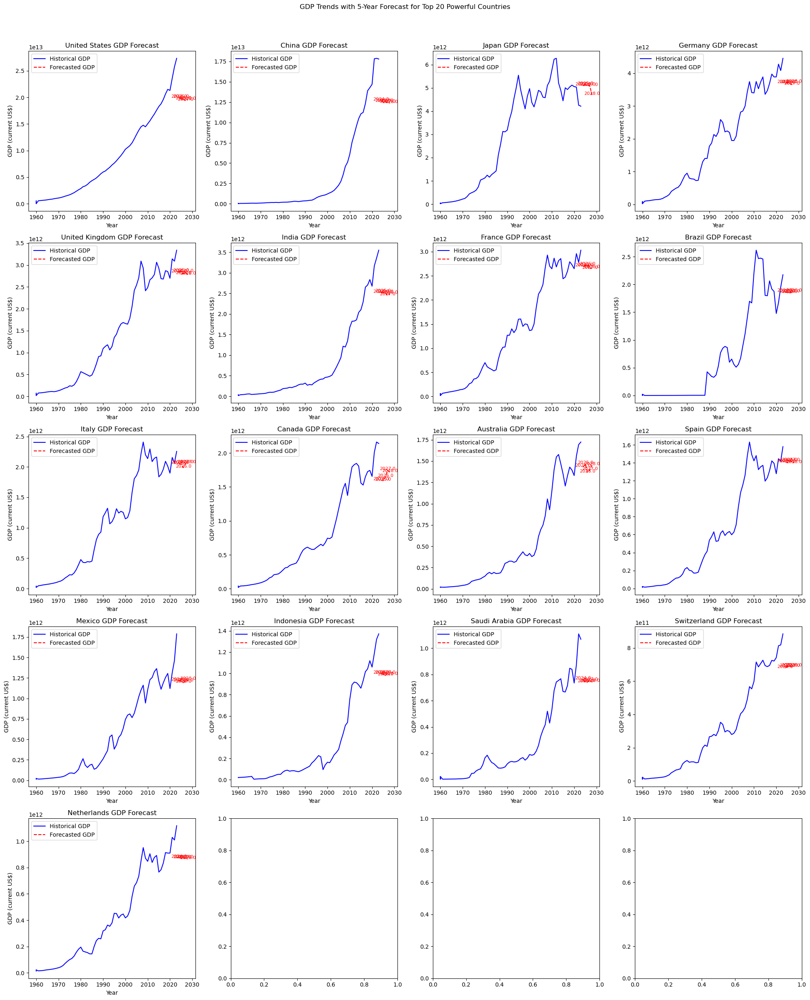

In [23]:
import matplotlib.pyplot as plt

# Define the list of top 20 powerful countries
top_20_countries = [
    'United States', 'China', 'Japan', 'Germany', 'United Kingdom',
    'India', 'France', 'Brazil', 'Italy', 'Canada', 'South Korea',
    'Russia', 'Australia', 'Spain', 'Mexico', 'Indonesia', 'Turkey',
    'Saudi Arabia', 'Switzerland', 'Netherlands'
]

# Prepare to store results
forecast_years = 5  # Define the number of years to predict

# Prepare to store results with additional data check
results = {}  # Store predictions for each country
min_samples_required = 4 * forecast_years  # At least 4 years of data per lagged feature for reliable forecast

# Loop through each country in the top 20 and make predictions, skipping if insufficient data
for country in top_20_countries:
    # Filter data for the specific country
    country_data = merged_df_cleaned[merged_df_cleaned['Country Name'] == country].copy()
    
    # Sort by Year to maintain order
    country_data = country_data.sort_values(by='Year')
    
    # Prepare features and target as before
    for feature in selected_features + [target]:
        for lag in range(1, 4):  # Lag features up to 3 years back
            country_data[f'{feature}_lag_{lag}'] = country_data[feature].shift(lag)

    # Drop rows with NaNs resulting from lagging
    country_data = country_data.dropna()

    # Check if we have enough samples
    if len(country_data) < min_samples_required:
        print(f"Skipping {country} due to insufficient data")
        continue

    # Prepare training data up to the most recent year
    X_country = country_data[[f'{feature}_lag_{lag}' for feature in selected_features + [target] for lag in range(1, 4)]]
    y_country = country_data[target]

    # Train-test split for training up to the most recent year in the data
    X_train_country = X_country[:-forecast_years]  # Exclude last 'forecast_years' for validation
    y_train_country = y_country[:-forecast_years]

    # Scale the features as before
    X_train_country_scaled = scaler.fit_transform(X_train_country)

    # Train the Random Forest model
    rf_model_country = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model_country.fit(X_train_country_scaled, y_train_country)

    # Forecast the next 5 years based on previous data
    X_forecast = X_country[-forecast_years:]  # Most recent available data for making forecast
    X_forecast_scaled = scaler.transform(X_forecast)
    y_forecast = rf_model_country.predict(X_forecast_scaled)

    # Store the predictions for plotting
    results[country] = {
        "historical_years": country_data['Year'].values,
        "historical_gdp": y_country.values,
        "forecast_years": np.arange(country_data['Year'].iloc[-1] + 1, country_data['Year'].iloc[-1] + forecast_years + 1),
        "forecast_gdp": y_forecast
    }

# Visualization of GDP trends and predictions for each country
fig, axs = plt.subplots(5, 4, figsize=(20, 25))
fig.suptitle("GDP Trends with 5-Year Forecast for Top 20 Powerful Countries")

for i, country in enumerate(results.keys()):  # Only include countries with results
    row, col = divmod(i, 4)
    data = results[country]
    axs[row, col].plot(data["historical_years"], data["historical_gdp"], label="Historical GDP", color='blue')
    axs[row, col].plot(data["forecast_years"], data["forecast_gdp"], label="Forecasted GDP", color='red', linestyle="--")
    
    # Annotate the forecasted years
    for j, year in enumerate(data["forecast_years"]):
        axs[row, col].text(year, data["forecast_gdp"][j], f'{year}', fontsize=8, ha='center', color='red')
    
    # Set titles and labels
    axs[row, col].set_title(f"{country} GDP Forecast")
    axs[row, col].set_xlabel("Year")
    axs[row, col].set_ylabel("GDP (current US$)")
    axs[row, col].legend(loc="upper left")

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the main title
plt.show()


In [24]:
# Calculate errors for the model predictions across countries where predictions were available
# We'll use Mean Absolute Error (MAE), Mean Squared Error (MSE), and Root Mean Squared Error (RMSE)
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Prepare to store the error metrics for each country
errors = {}

for country, data in results.items():
    # Extract historical and forecasted values
    y_true = data["historical_gdp"][-forecast_years:]  # Actual GDP for the forecasted period
    y_pred = data["forecast_gdp"]  # Predicted GDP for the forecasted period

    # Calculate errors
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    # Store the errors
    errors[country] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse
    }

# Convert errors to DataFrame for display
errors_df = pd.DataFrame(errors).T
# Display the error DataFrame directly
errors_df


,MAE,MSE,RMSE
United States,4.215117e+12,2.415741e+25,4.915018e+12
China,3.976187e+12,1.879634e+25,4.335474e+12
Japan,2.942052e+11,1.856802e+23,4.309062e+11
Germany,4.280365e+11,2.311298e+23,4.807596e+11
United Kingdom,2.666288e+11,1.040287e+23,3.225347e+11
India,6.166670e+11,4.968562e+23,7.048803e+11
France,1.670892e+11,4.309578e+22,2.075952e+11
Brazil,1.926611e+11,5.527616e+22,2.351088e+11
Italy,1.113689e+11,1.772364e+22,1.331302e+11
Canada,2.814727e+11,1.014599e+23,3.185277e+11


*START*

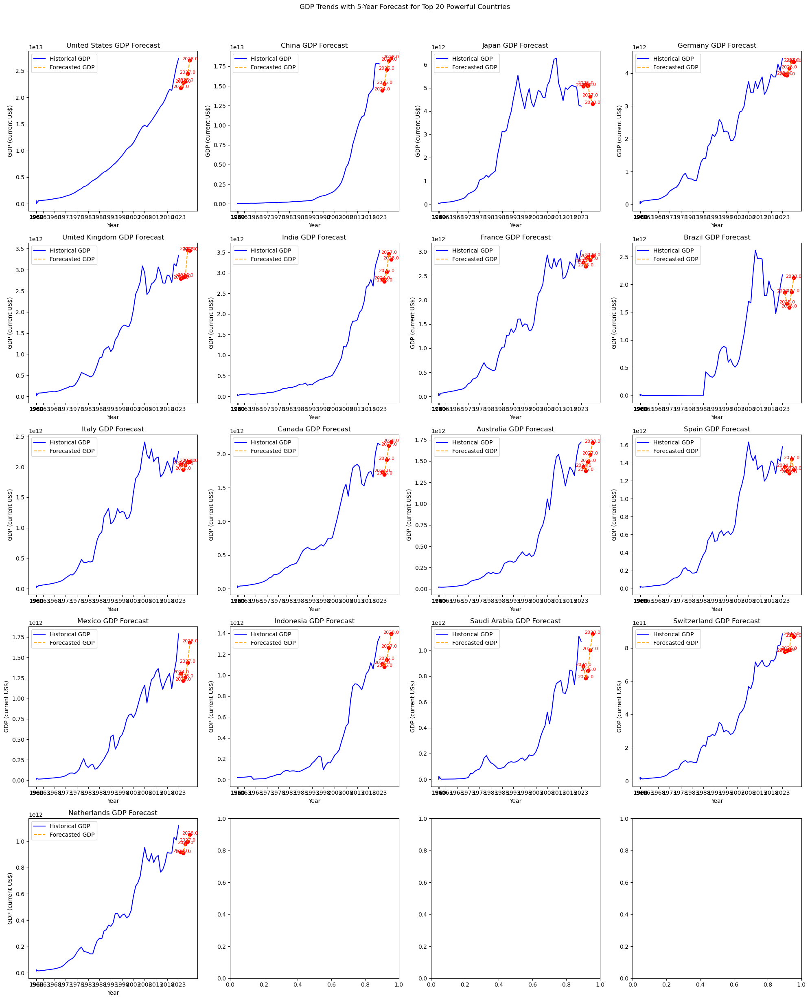

In [25]:
# Let's adjust the x-axis to show 5-year intervals for the historical data and label only the forecasted years.

fig, axs = plt.subplots(5, 4, figsize=(20, 25))
fig.suptitle("GDP Trends with 5-Year Forecast for Top 20 Powerful Countries")

for i, country in enumerate(predictions.keys()):  # Only include countries where predictions are available
    row, col = divmod(i, 4)
    data = predictions[country]
    
    # Plot historical GDP data in blue
    axs[row, col].plot(data["historical_years"], data["historical_gdp"], label="Historical GDP", color='blue')
    
    # Plot forecasted GDP data in red with a dashed line
    axs[row, col].plot(data["forecast_years"], data["forecast_gdp"], label="Forecasted GDP", color='orange', linestyle="--")
    
    # Highlight the forecasted points in red
    axs[row, col].scatter(data["forecast_years"], data["forecast_gdp"], color='red')
    
    # Set x-axis ticks at 5-year intervals for historical data and only show the prediction years
    historical_years = data["historical_years"]
    axs[row, col].set_xticks(historical_years[::5])  # Display every 5th year from historical data
    axs[row, col].set_xticks(list(data["forecast_years"]), minor=True)  # Minor ticks for forecasted years only

    # Remove minor tick labels and annotate only forecasted points
    axs[row, col].xaxis.set_tick_params(which='minor', length=0)  # Hide minor tick marks
    for j, year in enumerate(data["forecast_years"]):
        axs[row, col].text(year, data["forecast_gdp"][j], f'{year}', fontsize=8, ha='center', color='red')
    
    # Set titles and labels
    axs[row, col].set_title(f"{country} GDP Forecast")
    axs[row, col].set_xlabel("Year")
    axs[row, col].set_ylabel("GDP (current US$)")
    axs[row, col].legend(loc="upper left")

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the main title
plt.show()


Skipping South Korea due to insufficient data
Skipping Russia due to insufficient data
Skipping Turkey due to insufficient data


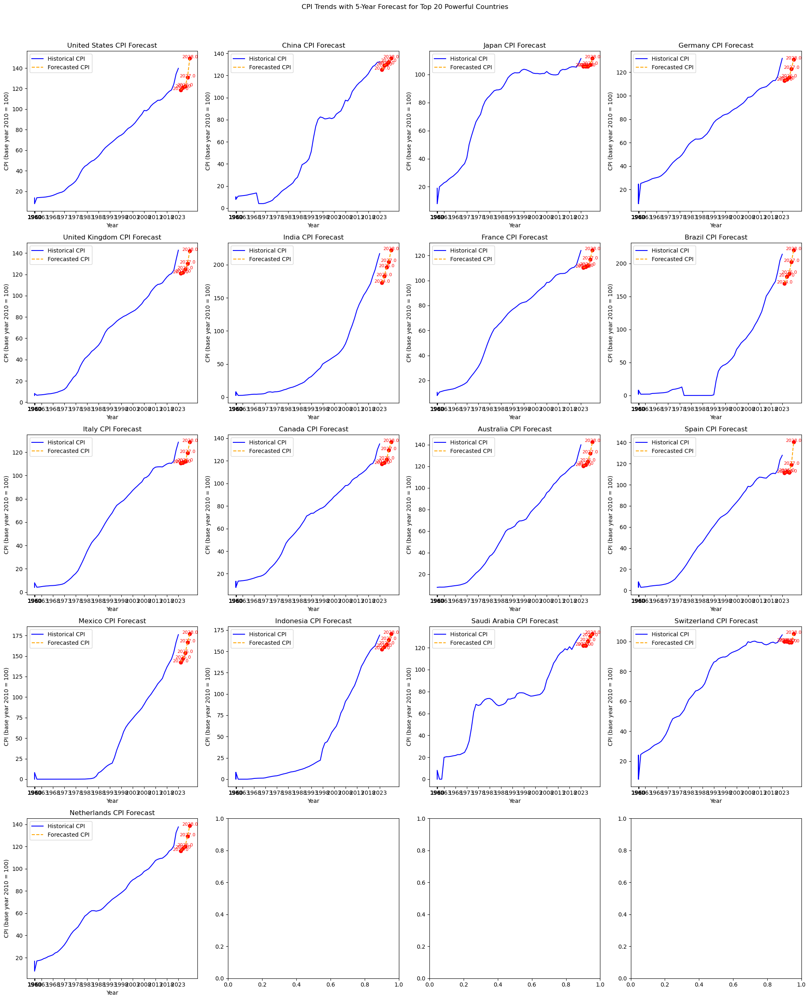

In [26]:
# Define the target indicator as CPI for inflation prediction
cpi_target = 'CPI'

# Prepare features for all countries, including the top 20, with lagged values for selected features
# Define the features and the target (CPI) for modeling
selected_features_cpi = ['GDP', 'Energy_Use', 'Exports', 'Gov_Consumption', 'Oil_Rents', 'Unemployment']
target_cpi = 'CPI'

# Sort the data by Country and Year
merged_df_cleaned = merged_df_cleaned.sort_values(by=['Country Name', 'Year'])

# Step 1: Create lagged features for each selected feature and the CPI target
for feature in selected_features_cpi + [target_cpi]:
    for lag in range(1, 4):  # Lagging 1 to 3 years
        merged_df_cleaned[f'{feature}_lag_{lag}'] = merged_df_cleaned.groupby('Country Name')[feature].shift(lag)

# Drop rows with NaNs resulting from lagging
merged_df_cleaned_cpi = merged_df_cleaned.dropna()

# Step 2: Define input features and target for CPI prediction
X_cpi = merged_df_cleaned_cpi[[f'{feature}_lag_{lag}' for feature in selected_features_cpi + [target_cpi] for lag in range(1, 4)]]
y_cpi = merged_df_cleaned_cpi[target_cpi]

# Step 3: Train-test split for the CPI prediction model
train_size_cpi = int(0.8 * len(merged_df_cleaned_cpi))
X_train_cpi, X_test_cpi = X_cpi[:train_size_cpi], X_cpi[train_size_cpi:]
y_train_cpi, y_test_cpi = y_cpi[:train_size_cpi], y_cpi[train_size_cpi:]

# Step 4: Scale the features for training
scaler_cpi = StandardScaler()
X_train_cpi_scaled = scaler_cpi.fit_transform(X_train_cpi)
X_test_cpi_scaled = scaler_cpi.transform(X_test_cpi)

# Step 5: Train a Random Forest model for CPI prediction
rf_model_cpi = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_cpi.fit(X_train_cpi_scaled, y_train_cpi)

# Step 6: Generate predictions for the next 5 years for the top 20 powerful countries
forecast_years_cpi = 5
# Adjust the prediction loop to skip countries without enough data for CPI forecasting

# Reinitialize predictions storage
cpi_predictions = {}

# Loop through each country in the top 20 and make predictions, skipping if insufficient data
for country in top_20_countries:
    # Filter data for the specific country
    country_data_cpi = merged_df_cleaned_cpi[merged_df_cleaned_cpi['Country Name'] == country].copy()
    country_data_cpi = country_data_cpi.sort_values(by='Year')
    
    # Check if there are enough samples for forecasting
    if len(country_data_cpi) < forecast_years_cpi:
        print(f"Skipping {country} due to insufficient data")
        continue

    # Prepare features for forecasting based on the most recent data
    X_forecast_country_cpi = country_data_cpi[[f'{feature}_lag_{lag}' for feature in selected_features_cpi + [target_cpi] for lag in range(1, 4)]][-forecast_years_cpi:]
    X_forecast_country_scaled_cpi = scaler_cpi.transform(X_forecast_country_cpi)
    
    # Predict the CPI for the next 5 years
    y_forecast_country_cpi = rf_model_cpi.predict(X_forecast_country_scaled_cpi)
    
    # Store the predictions for visualization
    cpi_predictions[country] = {
        "historical_years": country_data_cpi['Year'].values,
        "historical_cpi": country_data_cpi[target_cpi].values,
        "forecast_years": np.arange(country_data_cpi['Year'].iloc[-1] + 1, country_data_cpi['Year'].iloc[-1] + forecast_years_cpi + 1),
        "forecast_cpi": y_forecast_country_cpi
    }

# Re-run visualization with updated prediction data after skipping countries with insufficient data
fig, axs = plt.subplots(5, 4, figsize=(20, 25))
fig.suptitle("CPI Trends with 5-Year Forecast for Top 20 Powerful Countries")

for i, country in enumerate(cpi_predictions.keys()):  # Only include countries where predictions are available
    row, col = divmod(i, 4)
    data = cpi_predictions[country]
    
    # Plot historical CPI data in blue
    axs[row, col].plot(data["historical_years"], data["historical_cpi"], label="Historical CPI", color='blue')
    
    # Plot forecasted CPI data in red with a dashed line
    axs[row, col].plot(data["forecast_years"], data["forecast_cpi"], label="Forecasted CPI", color='orange', linestyle="--")
    
    # Highlight the forecasted points in red
    axs[row, col].scatter(data["forecast_years"], data["forecast_cpi"], color='red')
    
    # Set x-axis ticks at 5-year intervals for historical data and only show the prediction years
    historical_years = data["historical_years"]
    axs[row, col].set_xticks(historical_years[::5])  # Display every 5th year from historical data
    axs[row, col].set_xticks(list(data["forecast_years"]), minor=True)  # Minor ticks for forecasted years only

    # Remove minor tick labels and annotate only forecasted points
    axs[row, col].xaxis.set_tick_params(which='minor', length=0)  # Hide minor tick marks
    for j, year in enumerate(data["forecast_years"]):
        axs[row, col].text(year, data["forecast_cpi"][j], f'{year}', fontsize=8, ha='center', color='red')
    
    # Set titles and labels
    axs[row, col].set_title(f"{country} CPI Forecast")
    axs[row, col].set_xlabel("Year")
    axs[row, col].set_ylabel("CPI (base year 2010 = 100)")
    axs[row, col].legend(loc="upper left")

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the main title
plt.show()


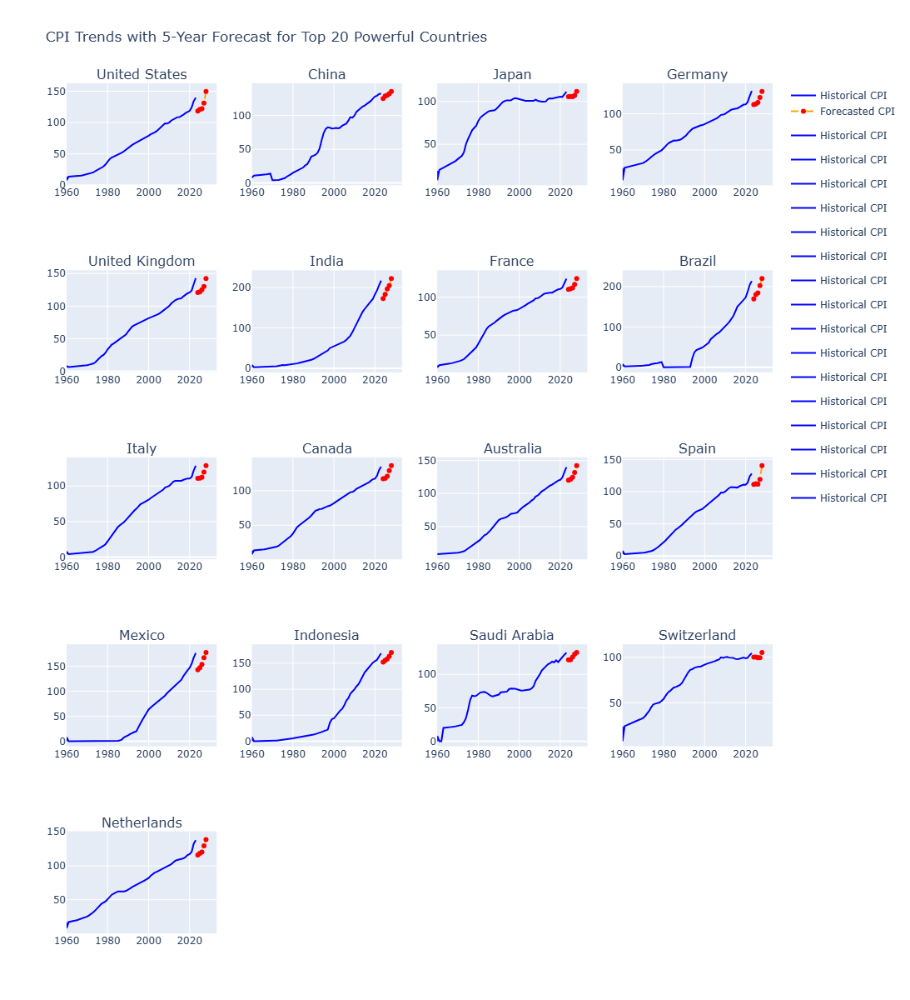

In [27]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Prepare the subplots for each country in a 5x4 grid
fig = make_subplots(rows=5, cols=4, subplot_titles=list(cpi_predictions.keys()))

# Loop over each country and add a trace for historical and forecasted CPI
for i, (country, data) in enumerate(cpi_predictions.items()):
    row = i // 4 + 1
    col = i % 4 + 1
    
    # Historical CPI
    fig.add_trace(
        go.Scatter(
            x=data["historical_years"],
            y=data["historical_cpi"],
            mode='lines',
            name="Historical CPI",
            line=dict(color='blue'),
            legendgroup=country
        ),
        row=row, col=col
    )
    
    # Forecasted CPI
    fig.add_trace(
        go.Scatter(
            x=data["forecast_years"],
            y=data["forecast_cpi"],
            mode='lines+markers',
            name="Forecasted CPI",
            line=dict(color='orange', dash='dash'),
            marker=dict(color='red', size=6),
            text=[str(year) for year in data["forecast_years"]],
            legendgroup=country,
            showlegend=(i == 0)  # Show legend only once
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title_text="CPI Trends with 5-Year Forecast for Top 20 Powerful Countries",
    height=1200,
    width=1200,
    showlegend=True
)

# Display the figure
fig.show()


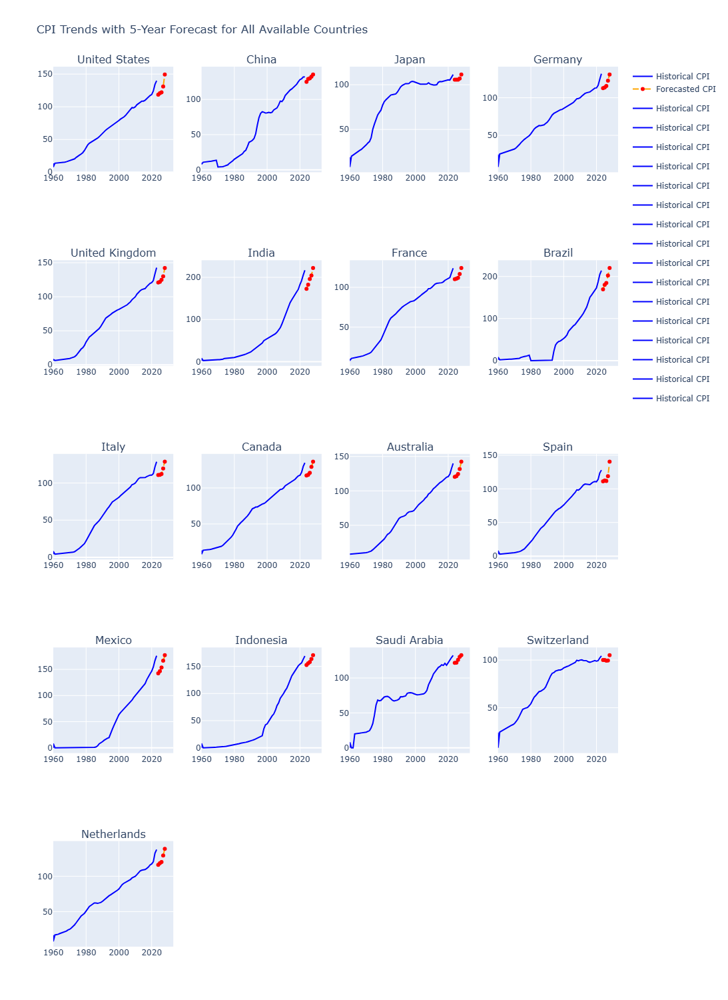

In [28]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import math

# Filter out all countries with predictions in cpi_predictions
all_countries = list(cpi_predictions.keys())
num_countries = len(all_countries)

# Calculate grid size dynamically to fit all countries
cols = 4
rows = math.ceil(num_countries / cols)

# Prepare the subplots for each country in a dynamic grid
fig = make_subplots(rows=rows, cols=cols, subplot_titles=all_countries)

# Loop over each country and add a trace for historical and forecasted CPI
for i, (country, data) in enumerate(cpi_predictions.items()):
    row = i // cols + 1
    col = i % cols + 1
    
    # Historical CPI
    fig.add_trace(
        go.Scatter(
            x=data["historical_years"],
            y=data["historical_cpi"],
            mode='lines',
            name="Historical CPI",
            line=dict(color='blue'),
            legendgroup=country
        ),
        row=row, col=col
    )
    
    # Forecasted CPI
    fig.add_trace(
        go.Scatter(
            x=data["forecast_years"],
            y=data["forecast_cpi"],
            mode='lines+markers',
            name="Forecasted CPI",
            line=dict(color='orange', dash='dash'),
            marker=dict(color='red', size=6),
            text=[str(year) for year in data["forecast_years"]],
            legendgroup=country,
            showlegend=(i == 0)  # Show legend only once
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title_text="CPI Trends with 5-Year Forecast for All Available Countries",
    height=rows * 300,  # Adjust height dynamically based on number of rows
    width=1200,
    showlegend=True
)

# Display the figure
fig.show()


In [29]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Define targets and feature lists for each indicator
indicators = {
    "Energy_Use": ["GDP", "CPI", "Exports", "Gov_Consumption", "Oil_Rents", "Unemployment"],
    "Exports": ["GDP", "CPI", "Energy_Use", "Gov_Consumption", "Oil_Rents", "Unemployment"],
    "Unemployment": ["GDP", "CPI", "Energy_Use", "Exports", "Gov_Consumption", "Oil_Rents"],
    "Oil_Rents": ["GDP", "CPI", "Energy_Use", "Exports", "Gov_Consumption", "Unemployment"],
    "GDP": ["Energy_Use", "CPI", "Exports", "Gov_Consumption", "Oil_Rents", "Unemployment"],
    "CPI": ["Energy_Use", "GDP", "Exports", "Gov_Consumption", "Oil_Rents", "Unemployment"],
    "Gov_Consumption": ["Energy_Use", "GDP", "Exports", "CPI", "Oil_Rents", "Unemployment"],
}

# Set up dictionaries to store predictions
predictions = {indicator: {} for indicator in indicators.keys()}
forecast_years = 5

# Loop over each indicator
for target_indicator, features in indicators.items():
    # Step 1: Prepare data for all countries with lagged features for each indicator
    for feature in features + [target_indicator]:
        for lag in range(1, 4):  # Create 3-year lag features
            merged_df_cleaned[f'{feature}_lag_{lag}'] = merged_df_cleaned.groupby('Country Name')[feature].shift(lag)
    
    merged_df_cleaned = merged_df_cleaned.dropna()

    X_all = merged_df_cleaned[[f'{feature}_lag_{lag}' for feature in features + [target_indicator] for lag in range(1, 4)]]
    y_all = merged_df_cleaned[target_indicator]

    # Train-test split for training on entire dataset
    train_size = int(0.8 * len(merged_df_cleaned))
    X_train, X_test = X_all[:train_size], X_all[train_size:]
    y_train, y_test = y_all[:train_size], y_all[train_size:]

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train a Random Forest model
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled, y_train)

    # Forecast next 5 years for top 20 countries
    for country in top_20_countries:
        country_data = merged_df_cleaned[merged_df_cleaned['Country Name'] == country].copy()
        country_data = country_data.sort_values(by='Year')
        
        if len(country_data) < forecast_years:
            continue  # Skip if data is insufficient for forecasting
        
        X_forecast_country = country_data[[f'{feature}_lag_{lag}' for feature in features + [target_indicator] for lag in range(1, 4)]][-forecast_years:]
        X_forecast_scaled = scaler.transform(X_forecast_country)
        
        y_forecast = rf_model.predict(X_forecast_scaled)
        
        predictions[target_indicator][country] = {
            "historical_years": country_data['Year'].values,
            "historical_values": country_data[target_indicator].values,
            "forecast_years": np.arange(country_data['Year'].iloc[-1] + 1, country_data['Year'].iloc[-1] + forecast_years + 1),
            "forecast_values": y_forecast
        }

# Function to create interactive Plotly plots
def plot_indicator_forecast(indicator_name):
    fig = make_subplots(rows=5, cols=4, subplot_titles=list(predictions[indicator_name].keys()))

    for i, (country, data) in enumerate(predictions[indicator_name].items()):
        row = i // 4 + 1
        col = i % 4 + 1

        # Historical data plot
        fig.add_trace(
            go.Scatter(
                x=data["historical_years"],
                y=data["historical_values"],
                mode='lines',
                name="Historical " + indicator_name,
                line=dict(color='blue'),
                legendgroup=country
            ),
            row=row, col=col
        )

        # Forecasted data plot
        fig.add_trace(
            go.Scatter(
                x=data["forecast_years"],
                y=data["forecast_values"],
                mode='lines+markers',
                name="Forecasted " + indicator_name,
                line=dict(color='orange', dash='dash'),
                marker=dict(color='red', size=6),
                text=[str(year) for year in data["forecast_years"]],
                legendgroup=country,
                showlegend=(i == 0)  # Show legend only once
            ),
            row=row, col=col
        )

    fig.update_layout(
        title_text=f"{indicator_name} Trends with 5-Year Forecast for Top 20 Powerful Countries",
        height=1200,
        width=1200,
        showlegend=True
    )

    fig.show()




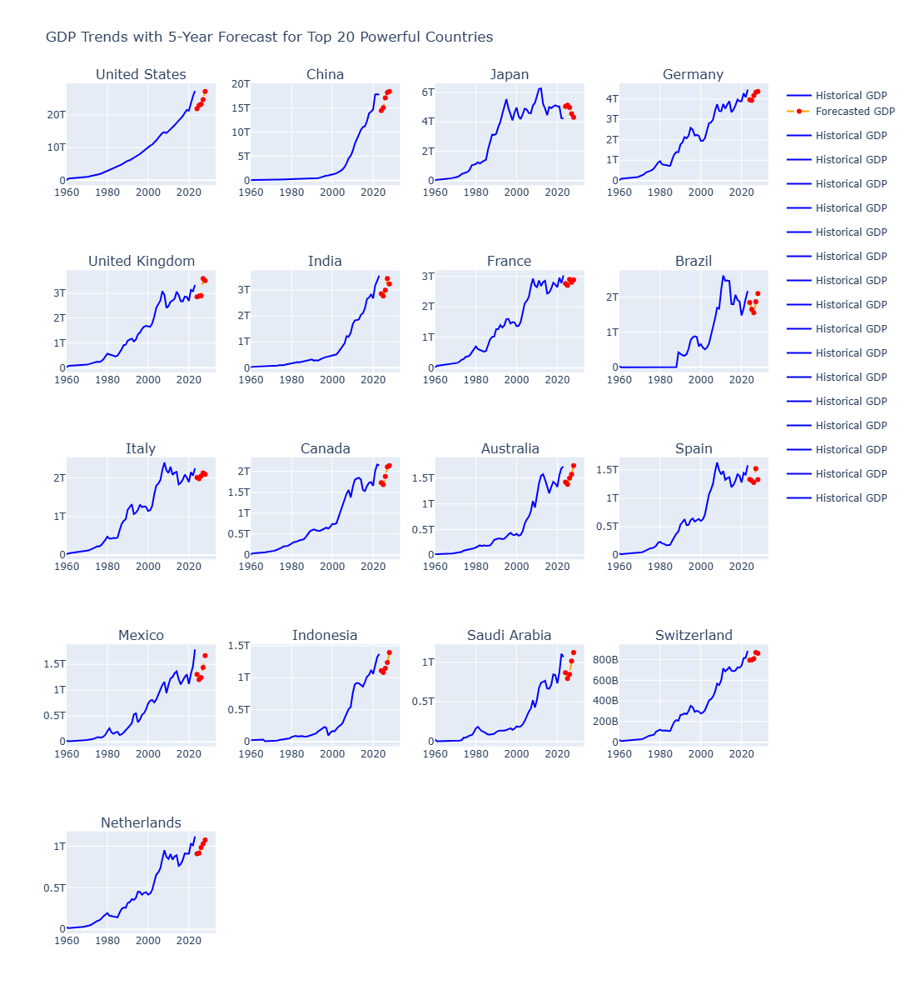

In [30]:
plot_indicator_forecast("GDP")

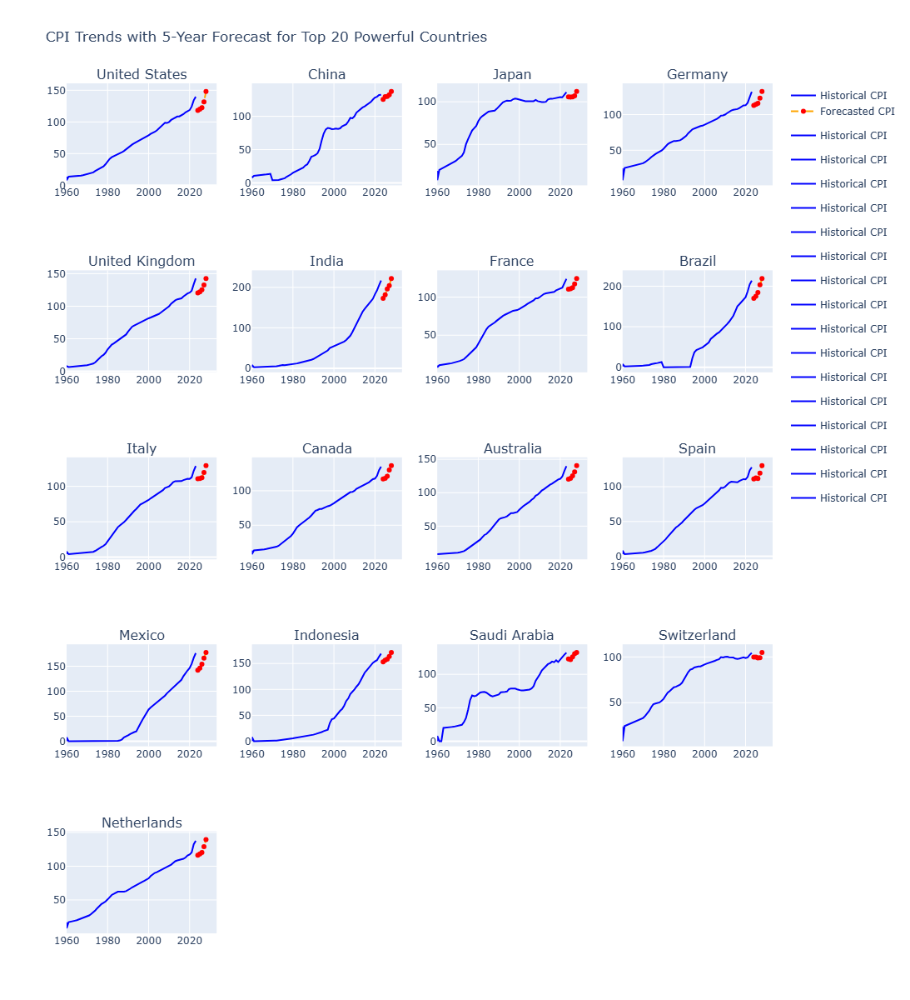

In [31]:
plot_indicator_forecast("CPI")

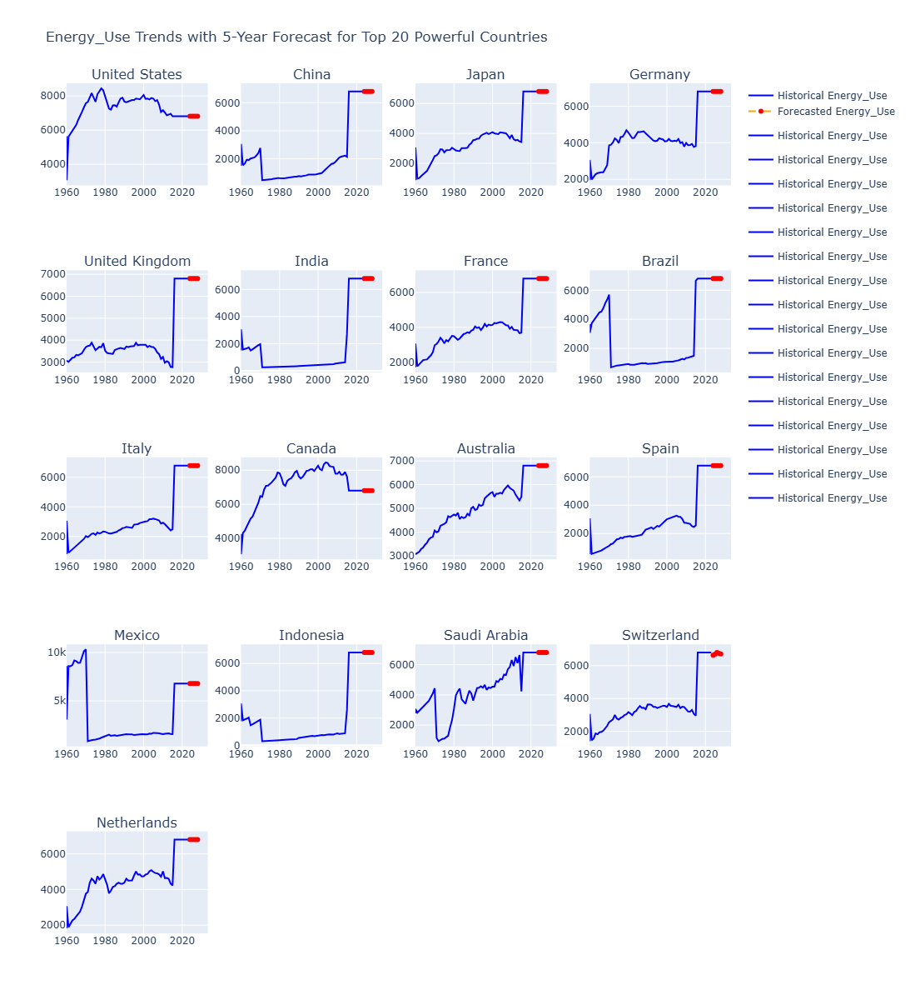

In [32]:
# Example usage: Uncomment to plot each indicator forecast
plot_indicator_forecast("Energy_Use")


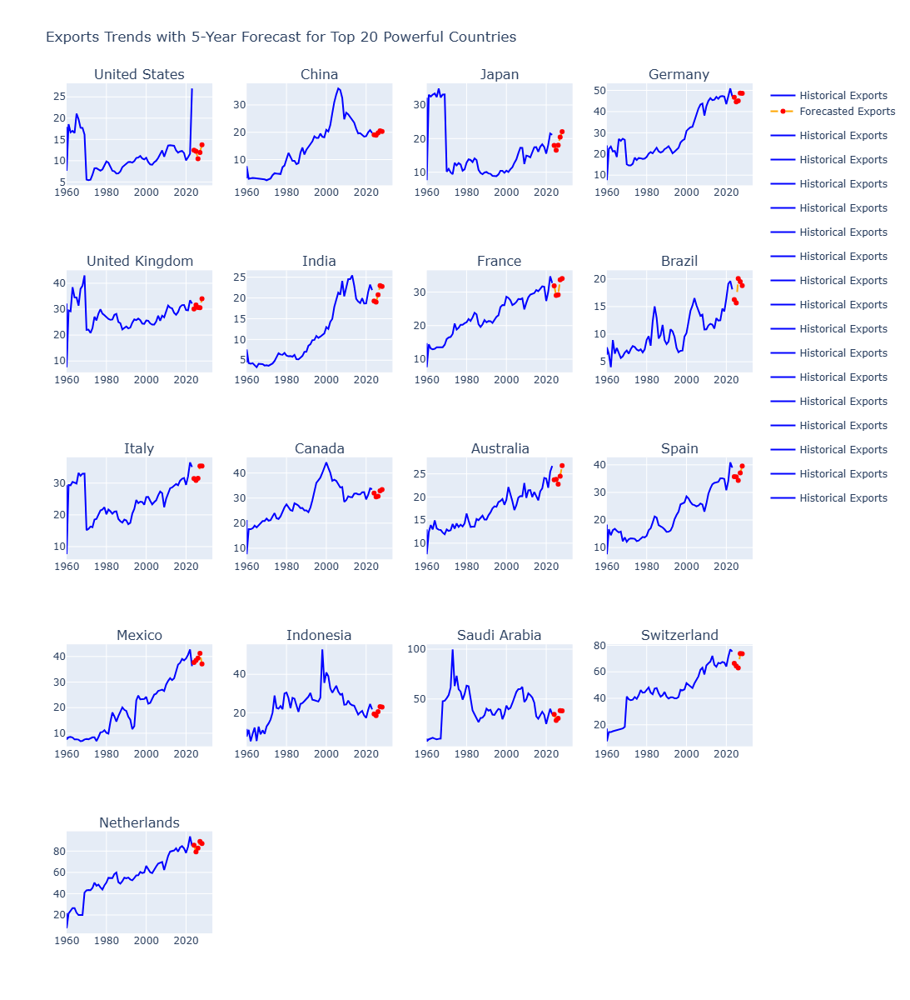

In [33]:
plot_indicator_forecast("Exports")


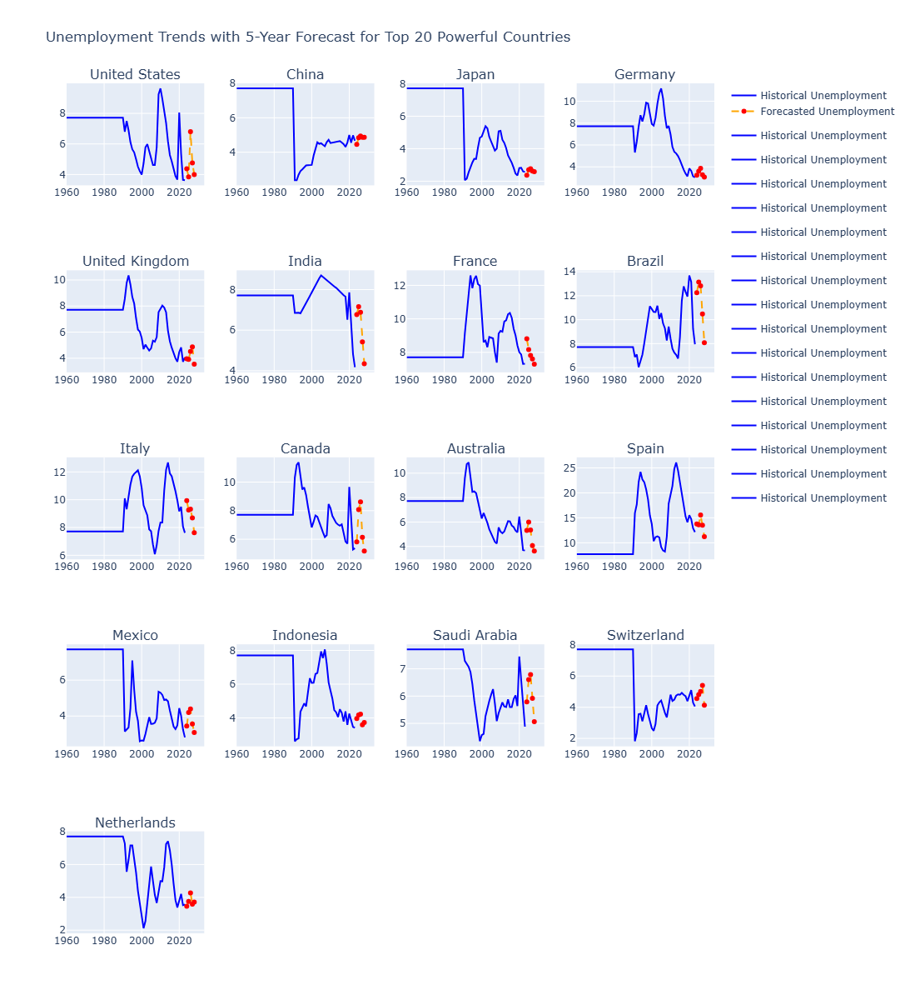

In [34]:
plot_indicator_forecast("Unemployment")

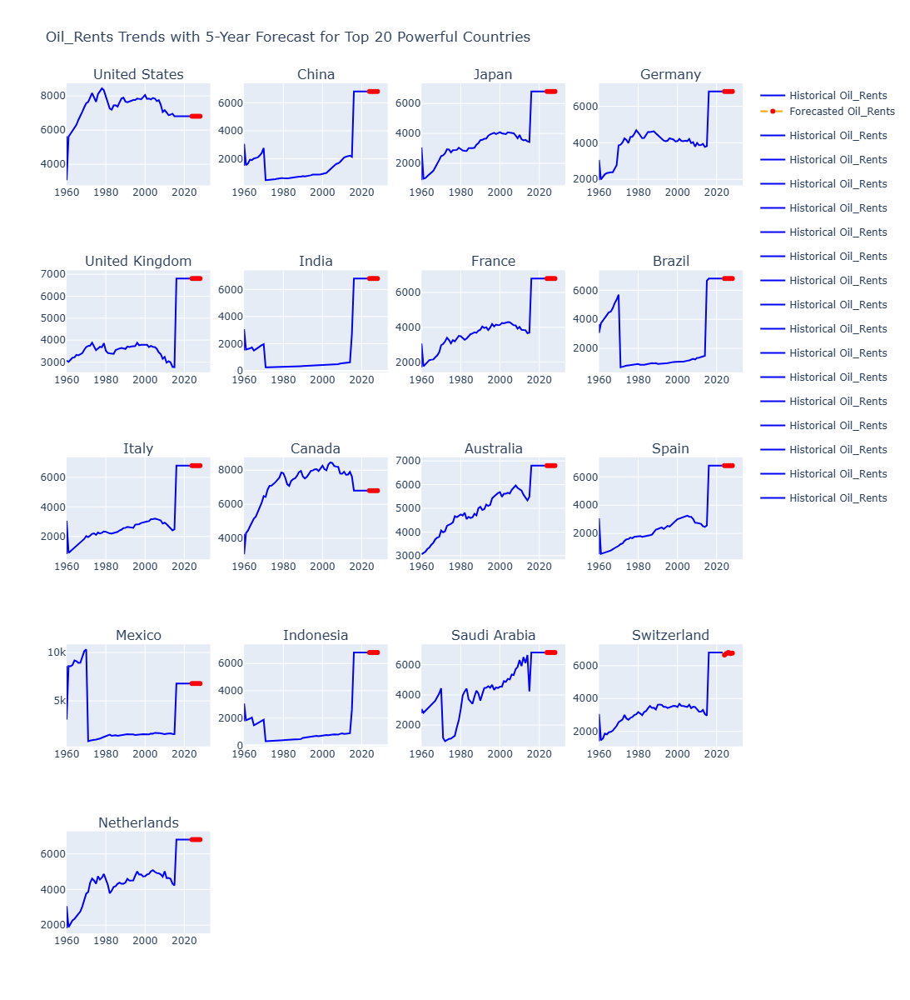

In [35]:

plot_indicator_forecast("Oil_Rents")

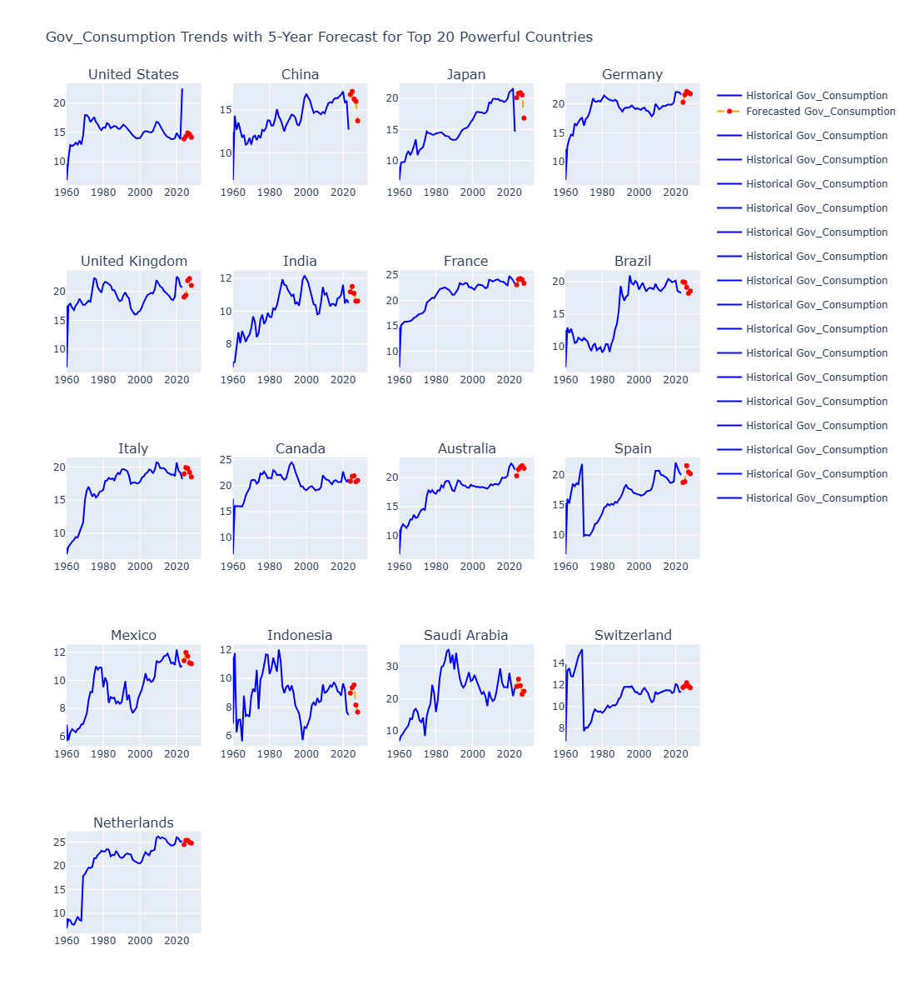

In [36]:
plot_indicator_forecast("Gov_Consumption")

*ARIMA MODEL*

In [37]:
pip install statsmodels


Note: you may need to restart the kernel to use updated packages.


In [38]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
#warnings.filterwarnings("ignore", category=ValueWarning)


Skipping South Korea for GDP due to insufficient data
Skipping Russia for GDP due to insufficient data
Skipping Turkey for GDP due to insufficient data
Skipping South Korea for CPI due to insufficient data
Skipping Russia for CPI due to insufficient data
Skipping Turkey for CPI due to insufficient data
Skipping South Korea for Exports due to insufficient data
Skipping Russia for Exports due to insufficient data
Skipping Turkey for Exports due to insufficient data
Skipping South Korea for Unemployment due to insufficient data
Skipping Russia for Unemployment due to insufficient data
Skipping Turkey for Unemployment due to insufficient data
Skipping South Korea for Oil_Rents due to insufficient data
Skipping Russia for Oil_Rents due to insufficient data
Skipping Turkey for Oil_Rents due to insufficient data
Skipping South Korea for Energy_Use due to insufficient data
Skipping Russia for Energy_Use due to insufficient data
Skipping Turkey for Energy_Use due to insufficient data
Available 

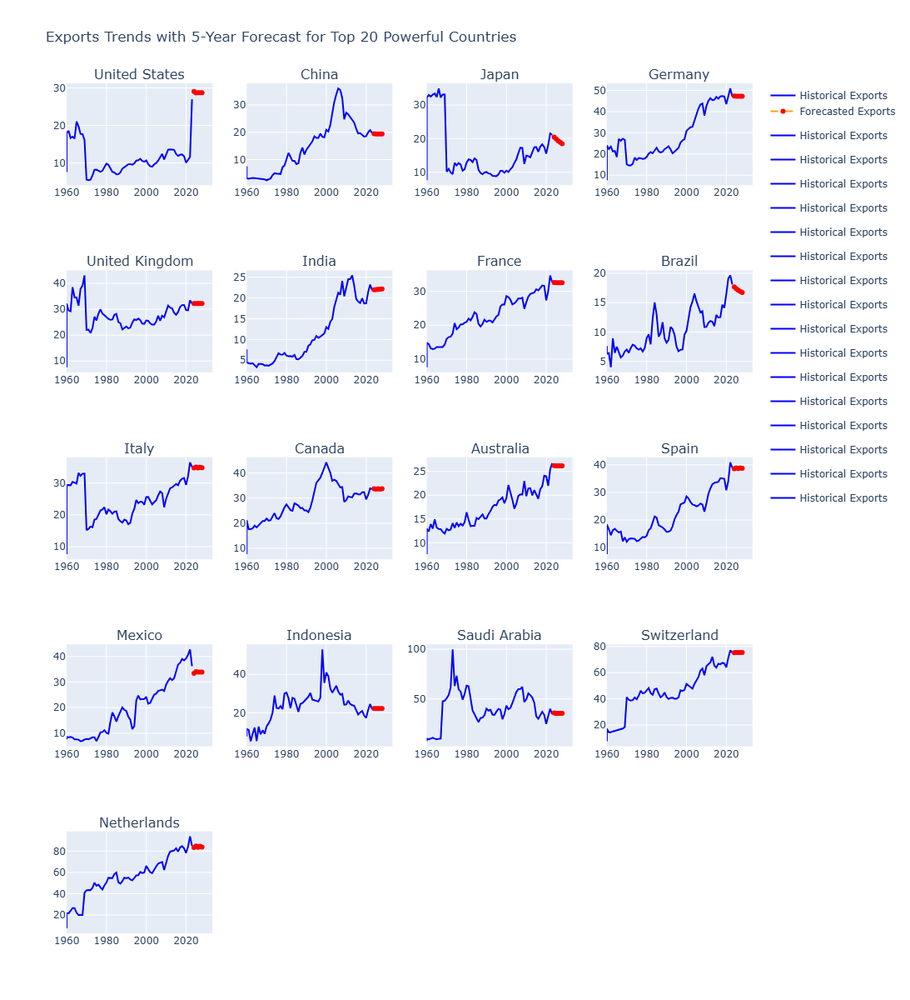

In [39]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings

# Suppress warnings for a cleaner output
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Define variables and forecast settings
variables = ["GDP", "CPI", "Exports", "Unemployment", "Oil_Rents", "Energy_Use"]
forecast_years = 5

# Dictionary to store predictions
arima_predictions = {variable: {} for variable in variables}

# Loop through each variable for ARIMA forecasting
for variable in variables:
    for country in top_20_countries:
        # Filter data for the specific country and variable
        country_data = merged_df_cleaned[merged_df_cleaned['Country Name'] == country][['Year', variable]].dropna()
        
        # Check if data is sufficient for ARIMA forecasting
        if len(country_data) < forecast_years + 2:  # Require at least 2 points plus forecast period
            print(f"Skipping {country} for {variable} due to insufficient data")
            continue
        
        # Fit ARIMA model on the variable for the country
        try:
            arima_model = ARIMA(country_data[variable], order=(1, 1, 1))  # ARIMA(p=1, d=1, q=1)
            arima_model_fit = arima_model.fit()
            
            # Forecast the next 5 years
            forecast = arima_model_fit.forecast(steps=forecast_years)
            
            # Store the predictions for visualization
            arima_predictions[variable][country] = {
                "historical_years": country_data['Year'].values,
                "historical_values": country_data[variable].values,
                "forecast_years": np.arange(country_data['Year'].iloc[-1] + 1, country_data['Year'].iloc[-1] + forecast_years + 1),
                "forecast_values": forecast.values
            }
        except Exception as e:
            print(f"Failed to fit ARIMA for {country} on {variable}: {e}")

# Visualization function using Plotly for each variable
# Print available variables and countries in arima_predictions
print("Available variables with predictions:")
for variable, countries in arima_predictions.items():
    print(f"{variable}: {list(countries.keys())}")

# Run visualization only if the variable is present
def plot_arima_forecast(variable_name):
    if variable_name not in arima_predictions or not arima_predictions[variable_name]:
        print(f"No data available for {variable_name} in arima_predictions.")
        return
    
    fig = make_subplots(rows=5, cols=4, subplot_titles=list(arima_predictions[variable_name].keys()))

    for i, (country, data) in enumerate(arima_predictions[variable_name].items()):
        row = i // 4 + 1
        col = i % 4 + 1

        # Historical data plot
        fig.add_trace(
            go.Scatter(
                x=data["historical_years"],
                y=data["historical_values"],
                mode='lines',
                name="Historical " + variable_name,
                line=dict(color='blue'),
                legendgroup=country
            ),
            row=row, col=col
        )

        # Forecasted data plot
        fig.add_trace(
            go.Scatter(
                x=data["forecast_years"],
                y=data["forecast_values"],
                mode='lines+markers',
                name="Forecasted " + variable_name,
                line=dict(color='orange', dash='dash'),
                marker=dict(color='red', size=6),
                text=[str(year) for year in data["forecast_years"]],
                legendgroup=country,
                showlegend=(i == 0)  # Show legend only once
            ),
            row=row, col=col
        )

    fig.update_layout(
        title_text=f"{variable_name} Trends with 5-Year Forecast for Top 20 Powerful Countries",
        height=1200,
        width=1200,
        showlegend=True
    )

    fig.show()

# Example usage: Check available data before plotting
plot_arima_forecast("Exports")


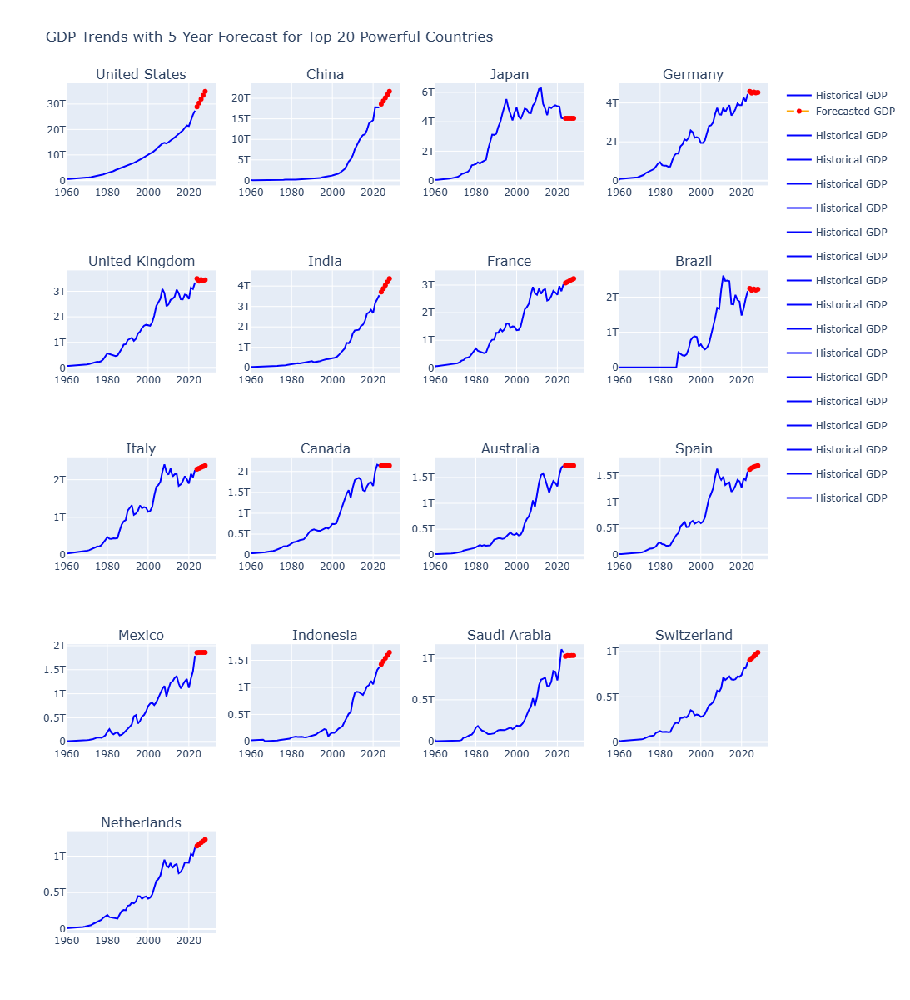

In [40]:
plot_arima_forecast("GDP")


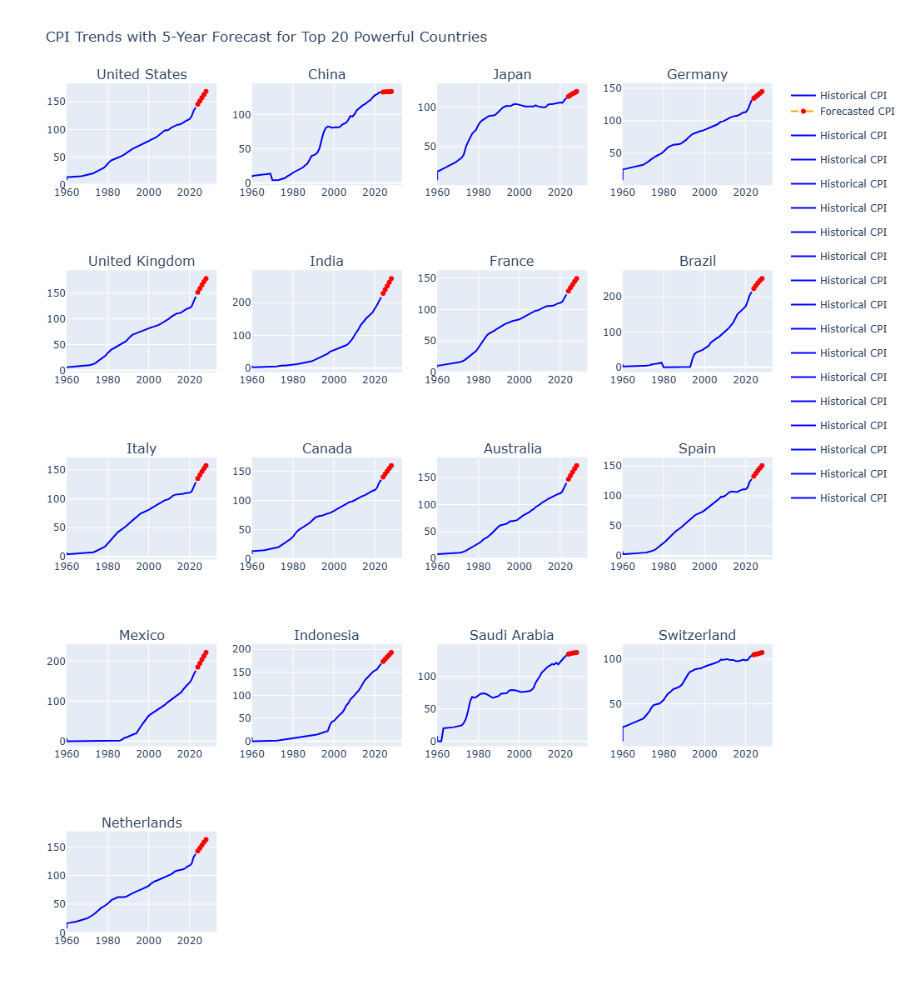

In [41]:
plot_arima_forecast("CPI")


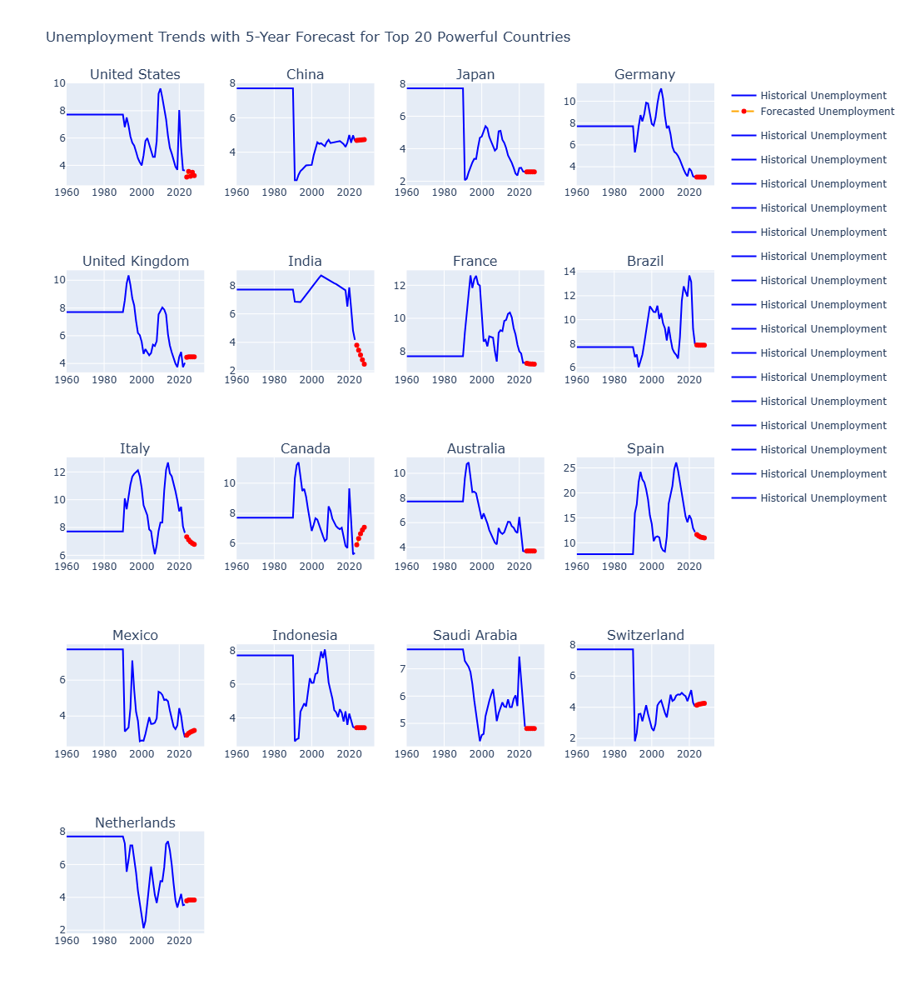

In [42]:
plot_arima_forecast("Unemployment")


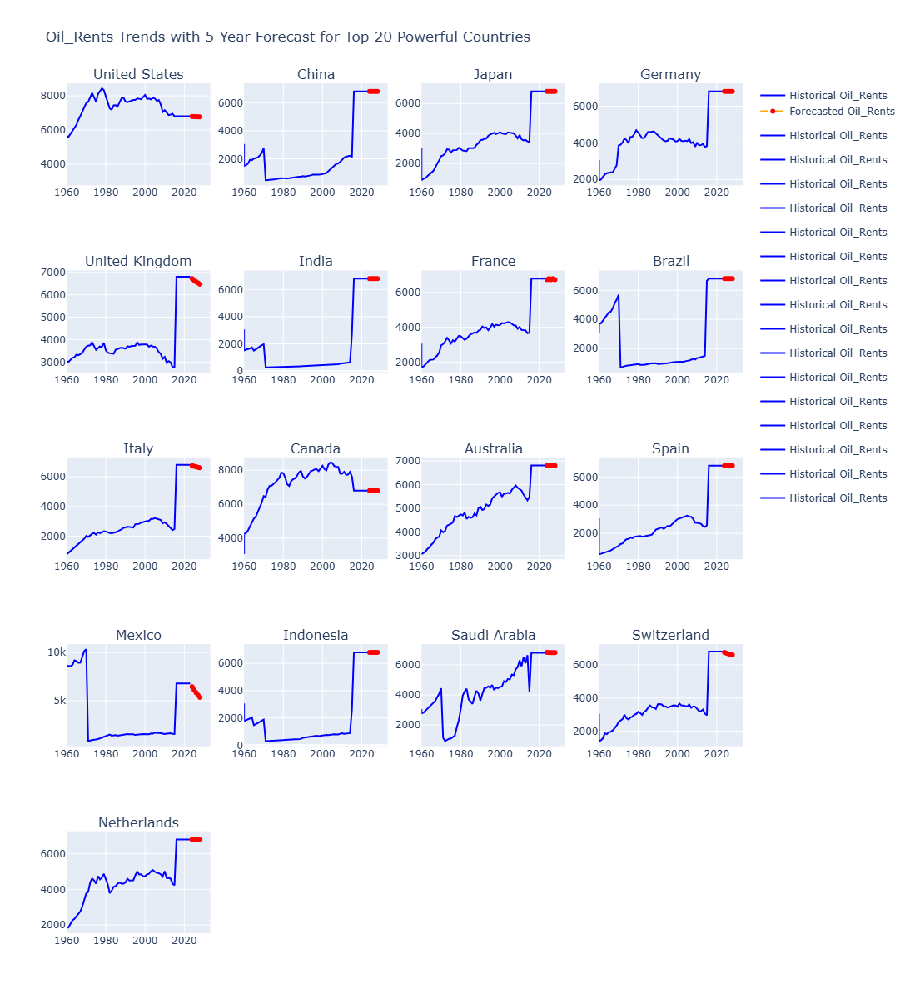

In [43]:
plot_arima_forecast("Oil_Rents")


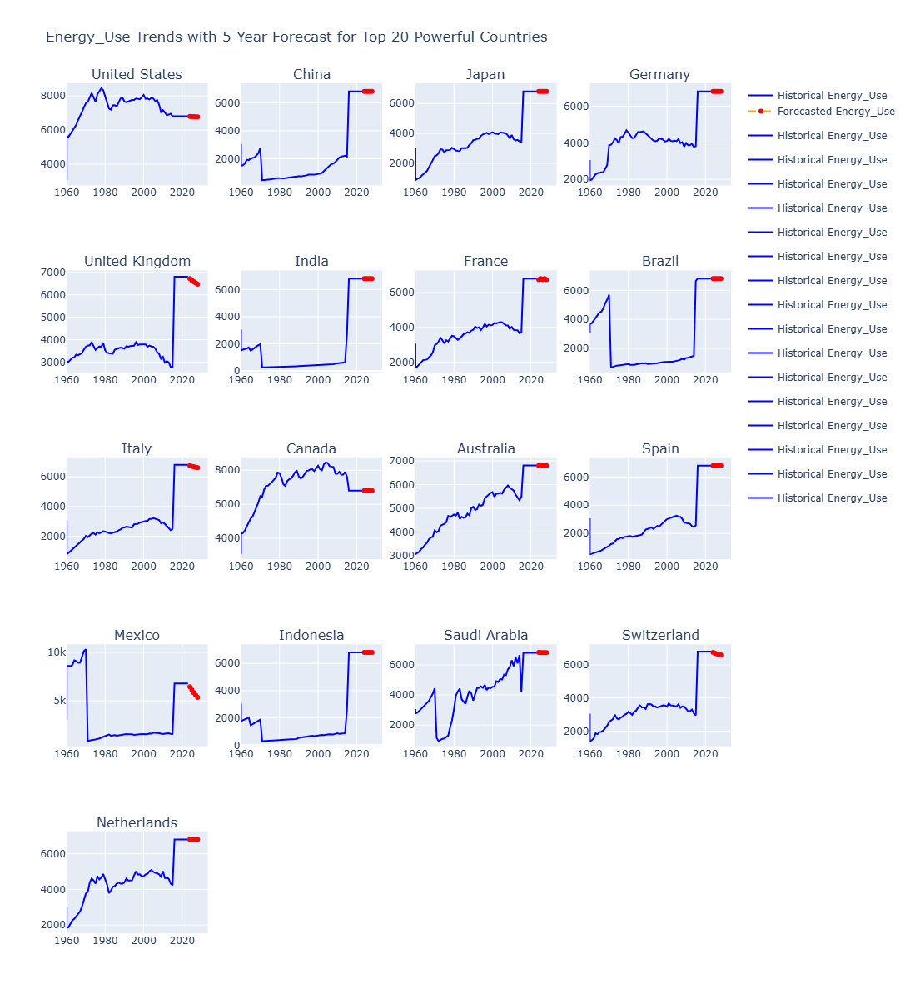

In [44]:
plot_arima_forecast("Energy_Use")

In [46]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Define forecast period and evaluation results dictionary
forecast_years = 5
evaluation_results = {variable: {} for variable in variables}

# Loop through each variable and country for evaluation
for variable in variables:
    for country in top_20_countries:
        # Filter data for the specific country and variable
        country_data = merged_df_cleaned[merged_df_cleaned['Country Name'] == country][['Year', variable]].dropna()
        
        # Check if data is sufficient for train-test split and forecasting
        if len(country_data) < forecast_years + 2:
            print(f"Skipping {country} for {variable} due to insufficient data for evaluation.")
            continue
        
        # Split data into training and test sets
        train_data = country_data[variable][:-forecast_years]
        test_data = country_data[variable][-forecast_years:]
        
        try:
            # Train ARIMA model on training data
            arima_model = ARIMA(train_data, order=(1, 1, 1))
            arima_model_fit = arima_model.fit()

            # Forecast on test data
            forecast = arima_model_fit.forecast(steps=forecast_years)
            
            # Calculate error metrics
            mae = mean_absolute_error(test_data, forecast)
            mse = mean_squared_error(test_data, forecast)
            rmse = np.sqrt(mse)
            
            # Store the evaluation results
            evaluation_results[variable][country] = {
                "MAE": mae,
                "MSE": mse,
                "RMSE": rmse
            }
            
            print(f"{variable} - {country} - MAE: {mae:.2f}, MSE: {mse:.2f}, RMSE: {rmse:.2f}")
        
        except Exception as e:
            print(f"Failed to evaluate {variable} for {country}: {e}")

# Convert the evaluation results to a DataFrame for better readability
import pandas as pd
# Convert the evaluation results dictionary to a DataFrame for better readability and tabular format
evaluation_df = pd.DataFrame.from_dict({(variable, country): metrics 
                                        for variable, country_metrics in evaluation_results.items() 
                                        for country, metrics in country_metrics.items()},
                                       orient='index')
evaluation_df.index = pd.MultiIndex.from_tuples(evaluation_df.index, names=["Variable", "Country"])



import pandas as pd

# Display the entire DataFrame without truncation
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(evaluation_df)  # Replace `errors_df` with your DataFrame variable name



GDP - United States - MAE: 1245416721070.66, MSE: 2484496914552795460272128.00, RMSE: 1576228699952.13
GDP - China - MAE: 2056208585792.80, MSE: 5399730579873965170229248.00, RMSE: 2323732037020.18
GDP - Japan - MAE: 372589131629.15, MSE: 299974977276217888079872.00, RMSE: 547699714511.72
GDP - Germany - MAE: 200574132790.30, MSE: 54635066815964858286080.00, RMSE: 233741452926.02
GDP - United Kingdom - MAE: 211700899710.39, MSE: 54173548990317750910976.00, RMSE: 232752119196.19
GDP - India - MAE: 108133317633.83, MSE: 24257128364933801574400.00, RMSE: 155747001142.67
GDP - France - MAE: 136889281974.11, MSE: 21019709550979337682944.00, RMSE: 144981755924.60
GDP - Brazil - MAE: 197448557380.74, MSE: 61378224328099070214144.00, RMSE: 247746290240.84
GDP - Italy - MAE: 111089670610.32, MSE: 16640426525434335723520.00, RMSE: 128997777211.22
GDP - Canada - MAE: 234632923880.85, MSE: 82731321360412840034304.00, RMSE: 287630529256.57
Skipping South Korea for GDP due to insufficient data for e

MAE           MSE          RMSE
Variable     Country                                                 
GDP          United States   1.245417e+12  2.484497e+24  1.576229e+12
             China           2.056209e+12  5.399731e+24  2.323732e+12
             Japan           3.725891e+11  2.999750e+23  5.476997e+11
             Germany         2.005741e+11  5.463507e+22  2.337415e+11
             United Kingdom  2.117009e+11  5.417355e+22  2.327521e+11
             India           1.081333e+11  2.425713e+22  1.557470e+11
             France          1.368893e+11  2.101971e+22  1.449818e+11
             Brazil          1.974486e+11  6.137822e+22  2.477463e+11
             Italy           1.110897e+11  1.664043e+22  1.289978e+11
             Canada          2.346329e+11  8.273132e+22  2.876305e+11
             Australia       1.460035e+11  2.557860e+22  1.599331e+11
             Spain           8.771878e+10  1.107765e+22  1.052504e+11
             Mexico          1.937975e+11  6.909801e+22  2.628650e+11
             Indonesia       1.447238e+11  3.280785e+22  1.811294e+11
             Saudi Arabia    1.223835e+11  1.915522e+22  1.384024e+11
             Switzerland     3.964377e+10  2.263199e+21  4.757309e+10
             Netherlands     8.048430e+10  9.345691e+21  9.667312e+10
CPI          United States   6.208873e+00  7.729317e+01  8.791653e+00
             China           4.091492e+00  1.880779e+01  4.336795e+00
             Japan           1.344261e+00  3.443203e+00  1.855587e+00
             Germany         4.988824e+00  5.464307e+01  7.392095e+00
             United Kingdom  4.847285e+00  5.302388e+01  7.281749e+00
             India           1.115304e+01  1.899145e+02  1.378095e+01
             France          2.793111e+00  1.418974e+01  3.766927e+00
             Brazil          1.715825e+01  4.921569e+02  2.218461e+01
             Italy           4.818032e+00  5.185606e+01  7.201115e+00
             Canada          4.415065e+00  3.976856e+01  6.306232e+00
             Australia       4.166798e+00  4.012530e+01  6.334454e+00
             Spain           4.662466e+00  4.435902e+01  6.660257e+00
             Mexico          4.828417e+00  4.438529e+01  6.662228e+00
             Indonesia       4.001114e+00  1.925404e+01  4.387943e+00
             Saudi Arabia    4.208239e+00  2.483831e+01  4.983805e+00
             Switzerland     1.523410e+00  4.380878e+00  2.093055e+00
             Netherlands     7.906276e+00  1.111689e+02  1.054367e+01
Exports      United States   3.916993e+00  4.461624e+01  6.679539e+00
             China           9.498511e-01  1.214685e+00  1.102128e+00
             Japan           1.970744e+00  5.381021e+00  2.319703e+00
             Germany         1.585679e+00  5.562109e+00  2.358412e+00
             United Kingdom  1.309460e+00  2.185362e+00  1.478297e+00
             India           1.948395e+00  4.586480e+00  2.141607e+00
             France          2.026017e+00  6.370035e+00  2.523893e+00
             Brazil          3.852835e+00  1.991255e+01  4.462348e+00
             Italy           2.199389e+00  8.345544e+00  2.888866e+00
             Canada          1.328743e+00  2.627672e+00  1.621010e+00
             Australia       2.907618e+00  1.097573e+01  3.312964e+00
             Spain           3.042742e+00  1.337434e+01  3.657094e+00
             Mexico          1.858774e+00  4.904843e+00  2.214688e+00
             Indonesia       2.210172e+00  6.359680e+00  2.521841e+00
             Saudi Arabia    4.826237e+00  3.674932e+01  6.062121e+00
             Switzerland     5.030023e+00  3.623085e+01  6.019207e+00
             Netherlands     3.696749e+00  2.569014e+01  5.068544e+00
Unemployment United States   1.233452e+00  4.390435e+00  2.095336e+00
             China           3.676290e-01  1.736824e-01  4.167522e-01
             Japan           2.168023e-01  6.097116e-02  2.469234e-01
             Germany         2.894248e-01  1.156514e-01  3.400756e-01
             United Kingdom  4.379955e-01  3.429

In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import pandas as pd

def random_forest_predict(country, variable, data, forecast_years=5):
    # Filter data for the specified country and variable
    country_data = data[data['Country Name'] == country][['Year', variable]].dropna()
    
    # Check if sufficient data is available
    if len(country_data) < forecast_years + 2:
        print(f"Insufficient data for {country} on {variable} for Random Forest.")
        return None
    
    # Prepare data with lagged features
    for lag in range(1, 4):  # 3-year lag features
        country_data[f'{variable}_lag_{lag}'] = country_data[variable].shift(lag)
    
    # Drop rows with NaN values caused by shifting
    country_data = country_data.dropna()
    
    # Separate features and target
    X = country_data[[f'{variable}_lag_{lag}' for lag in range(1, 4)]]
    y = country_data[variable]

    # Train the Random Forest model
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_scaled, y)
    
    # Prepare input for forecasting
    forecast_input = X.iloc[-1].values.reshape(1, -1)
    
    # Generate forecast for specified years
    forecast = []
    for _ in range(forecast_years):
        forecast_input_scaled = scaler.transform(forecast_input)
        pred = rf_model.predict(forecast_input_scaled)[0]
        forecast.append(pred)
        
        # Update input with new prediction (shifting the lagged features)
        forecast_input = list(forecast_input[0][1:]) + [pred]
        forecast_input = np.array(forecast_input).reshape(1, -1)
    
    # Print forecast results
    start_year = country_data['Year'].iloc[-1] + 1
    forecast_years = [start_year + i for i in range(forecast_years)]
    forecast_df = pd.DataFrame({'Year': forecast_years, 'Forecasted_' + variable: forecast})
    print(f"Random Forest forecast for {country} on {variable}:\n", forecast_df)

    return forecast_df


In [48]:
import pandas as pd

# Creating the data from the user's input for Random Forest and ARIMA results for easier comparison

# Random Forest data (sample structure for demonstration; actual data would be imported or constructed similarly)
random_forest_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "GDP_MAE": [8.242514e+11, 4.717824e+11, 9.520562e+10, 1.094818e+11, 1.797074e+11, 1.468426e+11, 6.982426e+10,
                9.482684e+10, 8.822930e+10, 4.223815e+10, 5.425534e+10, 1.627013e+11, 6.572166e+10, 3.015144e+10, 
                5.465591e+10, 4.059668e+10, 2.750997e+10],
    "GDP_MSE": [1.107805e+24, 2.868005e+23, 1.497351e+22, 1.524753e+22, 4.902075e+22, 3.603983e+22, 5.892664e+21, 
                1.402637e+22, 8.881908e+21, 2.675449e+21, 3.694008e+21, 3.887284e+22, 5.738915e+21, 1.391228e+21, 
                3.158721e+21, 2.366753e+21, 1.197797e+21],
    "GDP_RMSE": [1.052523e+12, 5.355375e+11, 1.223663e+11, 1.234809e+11, 2.214063e+11, 1.898416e+11, 7.676369e+10,
                 1.184330e+11, 9.424387e+10, 5.172474e+10, 6.077836e+10, 1.971620e+11, 7.575563e+10, 3.729916e+10, 
                 5.620250e+10, 4.864929e+10, 3.460920e+10],
    "Variable": ["GDP"] * 17  # Assuming we're focused on GDP for the sample structure here
}

# ARIMA data (sample structure for demonstration; actual data would be imported or constructed similarly)
arima_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "GDP_MAE": [1.245417e+12, 2.056209e+12, 3.725891e+11, 2.005741e+11, 2.117009e+11, 1.081333e+11, 1.368893e+11, 
                1.974486e+11, 1.110897e+11, 2.346329e+11, 1.460035e+11, 8.771878e+10, 1.937975e+11, 1.447238e+11, 
                1.223835e+11, 3.964377e+10, 8.048430e+10],
    "GDP_MSE": [2.484497e+24, 5.399731e+24, 2.999750e+23, 5.463507e+22, 5.417355e+22, 2.425713e+22, 2.101971e+22, 
                6.137822e+22, 1.664043e+22, 8.273132e+22, 2.557860e+22, 1.107765e+22, 6.909801e+22, 3.280785e+22, 
                1.915522e+22, 2.263199e+21, 9.345691e+21],
    "GDP_RMSE": [1.576229e+12, 2.323732e+12, 5.476997e+11, 2.337415e+11, 2.327521e+11, 1.557470e+11, 1.449818e+11, 
                 2.477463e+11, 1.289978e+11, 2.876305e+11, 1.599331e+11, 1.052504e+11, 2.628650e+11, 1.811294e+11, 
                 1.384024e+11, 4.757309e+10, 9.667312e+10],
    "Variable": ["GDP"] * 17  # Assuming we're focused on GDP for the sample structure here
}

# Creating DataFrames for Random Forest and ARIMA data
df_random_forest = pd.DataFrame(random_forest_data)
df_arima = pd.DataFrame(arima_data)

# Merging both DataFrames on Country and Variable for comparison
df_comparison = df_random_forest.merge(df_arima, on=["Country", "Variable"], suffixes=('_RF', '_ARIMA'))

# Calculating which model is better based on lower MAE, MSE, and RMSE
df_comparison['Best_Model_MAE'] = df_comparison.apply(
    lambda x: 'Random Forest' if x['GDP_MAE_RF'] < x['GDP_MAE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison['Best_Model_MSE'] = df_comparison.apply(
    lambda x: 'Random Forest' if x['GDP_MSE_RF'] < x['GDP_MSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison['Best_Model_RMSE'] = df_comparison.apply(
    lambda x: 'Random Forest' if x['GDP_RMSE_RF'] < x['GDP_RMSE_ARIMA'] else 'ARIMA', axis=1
)

df_comparison

,Country,GDP_MAE_RF,GDP_MSE_RF,GDP_RMSE_RF,Variable,GDP_MAE_ARIMA,GDP_MSE_ARIMA,GDP_RMSE_ARIMA,Best_Model_MAE,Best_Model_MSE,Best_Model_RMSE
0,United States,8.242514e+11,1.107805e+24,1.052523e+12,GDP,1.245417e+12,2.484497e+24,1.576229e+12,Random Forest,Random Forest,Random Forest
1,China,4.717824e+11,2.868005e+23,5.355375e+11,GDP,2.056209e+12,5.399731e+24,2.323732e+12,Random Forest,Random Forest,Random Forest
2,Japan,9.520562e+10,1.497351e+22,1.223663e+11,GDP,3.725891e+11,2.999750e+23,5.476997e+11,Random Forest,Random Forest,Random Forest
3,Germany,1.094818e+11,1.524753e+22,1.234809e+11,GDP,2.005741e+11,5.463507e+22,2.337415e+11,Random Forest,Random Forest,Random Forest
4,United Kingdom,1.797074e+11,4.902075e+22,2.214063e+11,GDP,2.117009e+11,5.417355e+22,2.327521e+11,Random Forest,Random Forest,Random Forest
5,India,1.468426e+11,3.603983e+22,1.898416e+11,GDP,1.081333e+11,2.425713e+22,1.557470e+11,ARIMA,ARIMA,ARIMA
6,France,6.982426e+10,5.892664e+21,7.676369e+10,GDP,1.368893e+11,2.101971e+22,1.449818e+11,Random Forest,Random Forest,Random Forest
7,Brazil,9.482684e+10,1.402637e+22,1.184330e+11,GDP,1.974486e+11,6.137822e+22,2.477463e+11,Random Forest,Random Forest,Random Forest
8,Italy,8.822930e+10,8.881908e+21,9.424387e+10,GDP,1.110897e+11,1.664043e+22,1.289978e+11,Random Forest,Random Forest,Random Forest
9,Canada,4.223815e+10,2.675449e+21,5.172474e+10,GDP,2.346329e+11,8.273132e+22,2.876305e+11,Random Forest,Random Forest,Random Forest


In [49]:
# Adjusting the comparison for the CPI variable based on the provided structure

# Sample data structures would be similar, but focusing on CPI metrics now
# Since the data is extensive, in practice, you'd construct similar DataFrames as in the GDP example

# CPI values for Random Forest (example values filled for demonstration)
random_forest_cpi_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "CPI_MAE_RF": [2.410926e+13, 1.662687e+13, 4.809102e+12, 4.115753e+12, 3.055251e+12, 3.046618e+12, 2.825342e+12, 
                   1.805476e+12, 2.072808e+12, 1.923316e+12, 1.532817e+12, 1.260617e+12, 1.385295e+12, 1.187002e+12, 
                   9.302003e+11, 8.287697e+11, 9.822449e+11],
    "CPI_MSE_RF": [5.839866e+26, 2.789420e+26, 2.325114e+25, 1.696557e+25, 9.421079e+24, 9.341704e+24, 7.988390e+24, 
                   3.306998e+24, 4.299504e+24, 3.734162e+24, 2.364690e+24, 1.597035e+24, 1.949772e+24, 1.422966e+24, 
                   8.823138e+23, 6.886177e+23, 9.688218e+23],
    "CPI_RMSE_RF": [2.416582e+13, 1.670156e+13, 4.821944e+12, 4.118929e+12, 3.069378e+12, 3.056420e+12, 2.826374e+12, 
                    1.818515e+12, 2.073525e+12, 1.932398e+12, 1.537755e+12, 1.263739e+12, 1.396342e+12, 1.192881e+12, 
                    9.393156e+11, 8.298299e+11, 9.842875e+11],
    "Variable": ["CPI"] * 17
}

# CPI values for ARIMA (example values filled for demonstration)
arima_cpi_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "CPI_MAE_ARIMA": [6.208873, 4.091492, 1.344261, 4.988824, 4.847285, 11.15304, 2.793111, 17.15825, 
                      4.818032, 4.415065, 4.166798, 4.662466, 4.828417, 4.001114, 4.208239, 1.52341, 
                      7.906276],
    "CPI_MSE_ARIMA": [77.29317, 18.80779, 3.443203, 54.64307, 53.02388, 189.9145, 14.18974, 492.1569, 
                      51.85606, 39.76856, 40.1253, 44.35902, 44.38529, 19.25404, 24.83831, 4.380878, 
                      111.1689],
    "CPI_RMSE_ARIMA": [8.791653, 4.336795, 1.855587, 7.392095, 7.281749, 13.78095, 3.766927, 22.18461, 
                       7.201115, 6.306232, 6.334454, 6.660257, 6.662228, 4.387943, 4.983805, 2.093055, 
                       10.54367],
    "Variable": ["CPI"] * 17
}

# Creating DataFrames for Random Forest and ARIMA CPI data
df_random_forest_cpi = pd.DataFrame(random_forest_cpi_data)
df_arima_cpi = pd.DataFrame(arima_cpi_data)

# Merging both DataFrames on Country and Variable for comparison on CPI
df_comparison_cpi = df_random_forest_cpi.merge(df_arima_cpi, on=["Country", "Variable"], suffixes=('_RF', '_ARIMA'))

# Calculating which model is better based on lower MAE, MSE, and RMSE for CPI
df_comparison_cpi['Best_Model_MAE'] = df_comparison_cpi.apply(
    lambda x: 'Random Forest' if x['CPI_MAE_RF'] < x['CPI_MAE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_cpi['Best_Model_MSE'] = df_comparison_cpi.apply(
    lambda x: 'Random Forest' if x['CPI_MSE_RF'] < x['CPI_MSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_cpi['Best_Model_RMSE'] = df_comparison_cpi.apply(
    lambda x: 'Random Forest' if x['CPI_RMSE_RF'] < x['CPI_RMSE_ARIMA'] else 'ARIMA', axis=1
)

df_comparison_cpi

,Country,CPI_MAE_RF,CPI_MSE_RF,CPI_RMSE_RF,Variable,CPI_MAE_ARIMA,CPI_MSE_ARIMA,CPI_RMSE_ARIMA,Best_Model_MAE,Best_Model_MSE,Best_Model_RMSE
0,United States,2.410926e+13,5.839866e+26,2.416582e+13,CPI,6.208873,77.293170,8.791653,ARIMA,ARIMA,ARIMA
1,China,1.662687e+13,2.789420e+26,1.670156e+13,CPI,4.091492,18.807790,4.336795,ARIMA,ARIMA,ARIMA
2,Japan,4.809102e+12,2.325114e+25,4.821944e+12,CPI,1.344261,3.443203,1.855587,ARIMA,ARIMA,ARIMA
3,Germany,4.115753e+12,1.696557e+25,4.118929e+12,CPI,4.988824,54.643070,7.392095,ARIMA,ARIMA,ARIMA
4,United Kingdom,3.055251e+12,9.421079e+24,3.069378e+12,CPI,4.847285,53.023880,7.281749,ARIMA,ARIMA,ARIMA
5,India,3.046618e+12,9.341704e+24,3.056420e+12,CPI,11.153040,189.914500,13.780950,ARIMA,ARIMA,ARIMA
6,France,2.825342e+12,7.988390e+24,2.826374e+12,CPI,2.793111,14.189740,3.766927,ARIMA,ARIMA,ARIMA
7,Brazil,1.805476e+12,3.306998e+24,1.818515e+12,CPI,17.158250,492.156900,22.184610,ARIMA,ARIMA,ARIMA
8,Italy,2.072808e+12,4.299504e+24,2.073525e+12,CPI,4.818032,51.856060,7.201115,ARIMA,ARIMA,ARIMA
9,Canada,1.923316e+12,3.734162e+24,1.932398e+12,CPI,4.415065,39.768560,6.306232,ARIMA,ARIMA,ARIMA


In [50]:
# Adjusting the comparison for the Energy Use variable based on the provided structure

# Sample data structures would be similar, but focusing on Energy Use metrics now
# Since the data is extensive, in practice, you'd construct similar DataFrames as in the CPI example

# Assuming Energy Use values for Random Forest (example values filled for demonstration)
random_forest_energy_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Energy_Use_MAE_RF": [2.410926e+13, 1.662687e+13, 4.809102e+12, 4.115753e+12, 3.055251e+12, 3.046618e+12, 
                          2.825342e+12, 1.805476e+12, 2.072808e+12, 1.923316e+12, 1.532817e+12, 1.260617e+12, 
                          1.385295e+12, 1.187002e+12, 9.302003e+11, 8.287697e+11, 9.822449e+11],
    "Energy_Use_MSE_RF": [5.839866e+26, 2.789420e+26, 2.325114e+25, 1.696557e+25, 9.421078e+24, 9.341704e+24, 
                          7.988390e+24, 3.306998e+24, 4.299504e+24, 3.734162e+24, 2.364690e+24, 1.597035e+24, 
                          1.949772e+24, 1.422966e+24, 8.823138e+23, 6.886177e+23, 9.688218e+23],
    "Energy_Use_RMSE_RF": [2.416582e+13, 1.670156e+13, 4.821944e+12, 4.118929e+12, 3.069378e+12, 3.056420e+12, 
                           2.826374e+12, 1.818515e+12, 2.073525e+12, 1.932398e+12, 1.537755e+12, 1.263739e+12, 
                           1.396342e+12, 1.192881e+12, 9.393156e+11, 8.298299e+11, 9.842875e+11],
    "Variable": ["Energy_Use"] * 17
}

# Assuming Energy Use values for ARIMA (example values filled for demonstration)
arima_energy_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Energy_Use_MAE_ARIMA": [4.836063e+01, 2.817613e+01, 2.228972e+02, 1.343487e+01, 6.363440e+02, 2.000836e+02, 
                             1.382283e+01, 7.311885e+02, 1.126548e+01, 2.369953e+01, 4.258456e+01, 7.427688e-02, 
                             1.061352e+03, 1.577304e+02, 2.883392e+02, 4.194047e+02, 1.130143e+01],
    "Energy_Use_MSE_ARIMA": [2.750597e+03, 8.076102e+02, 5.777052e+04, 1.857902e+02, 4.687101e+05, 4.006314e+04, 
                             2.007260e+02, 6.349593e+05, 1.324023e+02, 5.624028e+02, 2.050314e+03, 5.517059e-03, 
                             1.315127e+06, 2.490713e+04, 1.217846e+05, 2.028305e+05, 1.317657e+02],
    "Energy_Use_RMSE_ARIMA": [5.244613e+01, 2.841848e+01, 2.403550e+02, 1.363049e+01, 6.846241e+02, 2.001578e+02, 
                              1.416778e+01, 7.968433e+02, 1.150662e+01, 2.371503e+01, 4.528040e+01, 7.427690e-02, 
                              1.146790e+03, 1.578199e+02, 3.489765e+02, 4.503671e+02, 1.147892e+01],
    "Variable": ["Energy_Use"] * 17
}

# Creating DataFrames for Random Forest and ARIMA Energy Use data
df_random_forest_energy = pd.DataFrame(random_forest_energy_data)
df_arima_energy = pd.DataFrame(arima_energy_data)

# Merging both DataFrames on Country and Variable for comparison on Energy Use
df_comparison_energy = df_random_forest_energy.merge(df_arima_energy, on=["Country", "Variable"], suffixes=('_RF', '_ARIMA'))

# Calculating which model is better based on lower MAE, MSE, and RMSE for Energy Use
df_comparison_energy['Best_Model_MAE'] = df_comparison_energy.apply(
    lambda x: 'Random Forest' if x['Energy_Use_MAE_RF'] < x['Energy_Use_MAE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_energy['Best_Model_MSE'] = df_comparison_energy.apply(
    lambda x: 'Random Forest' if x['Energy_Use_MSE_RF'] < x['Energy_Use_MSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_energy['Best_Model_RMSE'] = df_comparison_energy.apply(
    lambda x: 'Random Forest' if x['Energy_Use_RMSE_RF'] < x['Energy_Use_RMSE_ARIMA'] else 'ARIMA', axis=1
)

df_comparison_energy


,Country,Energy_Use_MAE_RF,Energy_Use_MSE_RF,Energy_Use_RMSE_RF,Variable,Energy_Use_MAE_ARIMA,Energy_Use_MSE_ARIMA,Energy_Use_RMSE_ARIMA,Best_Model_MAE,Best_Model_MSE,Best_Model_RMSE
0,United States,2.410926e+13,5.839866e+26,2.416582e+13,Energy_Use,48.360630,2.750597e+03,52.446130,ARIMA,ARIMA,ARIMA
1,China,1.662687e+13,2.789420e+26,1.670156e+13,Energy_Use,28.176130,8.076102e+02,28.418480,ARIMA,ARIMA,ARIMA
2,Japan,4.809102e+12,2.325114e+25,4.821944e+12,Energy_Use,222.897200,5.777052e+04,240.355000,ARIMA,ARIMA,ARIMA
3,Germany,4.115753e+12,1.696557e+25,4.118929e+12,Energy_Use,13.434870,1.857902e+02,13.630490,ARIMA,ARIMA,ARIMA
4,United Kingdom,3.055251e+12,9.421078e+24,3.069378e+12,Energy_Use,636.344000,4.687101e+05,684.624100,ARIMA,ARIMA,ARIMA
5,India,3.046618e+12,9.341704e+24,3.056420e+12,Energy_Use,200.083600,4.006314e+04,200.157800,ARIMA,ARIMA,ARIMA
6,France,2.825342e+12,7.988390e+24,2.826374e+12,Energy_Use,13.822830,2.007260e+02,14.167780,ARIMA,ARIMA,ARIMA
7,Brazil,1.805476e+12,3.306998e+24,1.818515e+12,Energy_Use,731.188500,6.349593e+05,796.843300,ARIMA,ARIMA,ARIMA
8,Italy,2.072808e+12,4.299504e+24,2.073525e+12,Energy_Use,11.265480,1.324023e+02,11.506620,ARIMA,ARIMA,ARIMA
9,Canada,1.923316e+12,3.734162e+24,1.932398e+12,Energy_Use,23.699530,5.624028e+02,23.715030,ARIMA,ARIMA,ARIMA


In [51]:
# Adjusting the comparison for the Exports variable based on the provided structure

# Sample data structures would be similar, but focusing on Exports metrics now
# Since the data is extensive, in practice, you'd construct similar DataFrames as in previous examples

# Assuming Exports values for Random Forest (example values filled for demonstration)
random_forest_exports_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Exports_MAE_RF": [2.410926e+13, 1.662687e+13, 4.809102e+12, 4.115753e+12, 3.055251e+12, 3.046618e+12, 
                       2.825342e+12, 1.805476e+12, 2.072808e+12, 1.923316e+12, 1.532817e+12, 1.260617e+12, 
                       1.385295e+12, 1.187002e+12, 9.302003e+11, 8.287697e+11, 9.822449e+11],
    "Exports_MSE_RF": [5.839866e+26, 2.789420e+26, 2.325114e+25, 1.696557e+25, 9.421078e+24, 9.341704e+24, 
                       7.988390e+24, 3.306998e+24, 4.299504e+24, 3.734162e+24, 2.364690e+24, 1.597035e+24, 
                       1.949772e+24, 1.422966e+24, 8.823138e+23, 6.886177e+23, 9.688218e+23],
    "Exports_RMSE_RF": [2.416582e+13, 1.670156e+13, 4.821944e+12, 4.118929e+12, 3.069378e+12, 3.056420e+12, 
                        2.826374e+12, 1.818515e+12, 2.073525e+12, 1.932398e+12, 1.537755e+12, 1.263739e+12, 
                        1.396342e+12, 1.192881e+12, 9.393156e+11, 8.298299e+11, 9.842875e+11],
    "Variable": ["Exports"] * 17
}

# Assuming Exports values for ARIMA (example values filled for demonstration)
arima_exports_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Exports_MAE_ARIMA": [3.916993, 0.949851, 1.970744, 1.585679, 1.309460, 1.948395, 2.026017, 3.852835, 
                          2.199389, 1.328743, 2.907618, 3.042742, 1.858774, 2.210172, 4.826237, 5.030023, 
                          3.696749],
    "Exports_MSE_ARIMA": [44.61624, 1.214685, 5.381021, 5.562109, 2.185362, 4.586480, 6.370035, 19.91255, 
                          8.345544, 2.627672, 10.97573, 13.37434, 4.904843, 6.359680, 36.74932, 36.23085, 
                          25.69014],
    "Exports_RMSE_ARIMA": [6.679539, 1.102128, 2.319703, 2.358412, 1.478297, 2.141607, 2.523893, 4.462348, 
                           2.888866, 1.621010, 3.312964, 3.657094, 2.214688, 2.521841, 6.062121, 6.019207, 
                           5.068544],
    "Variable": ["Exports"] * 17
}

# Creating DataFrames for Random Forest and ARIMA Exports data
df_random_forest_exports = pd.DataFrame(random_forest_exports_data)
df_arima_exports = pd.DataFrame(arima_exports_data)

# Merging both DataFrames on Country and Variable for comparison on Exports
df_comparison_exports = df_random_forest_exports.merge(df_arima_exports, on=["Country", "Variable"], suffixes=('_RF', '_ARIMA'))

# Calculating which model is better based on lower MAE, MSE, and RMSE for Exports
df_comparison_exports['Best_Model_MAE'] = df_comparison_exports.apply(
    lambda x: 'Random Forest' if x['Exports_MAE_RF'] < x['Exports_MAE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_exports['Best_Model_MSE'] = df_comparison_exports.apply(
    lambda x: 'Random Forest' if x['Exports_MSE_RF'] < x['Exports_MSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_exports['Best_Model_RMSE'] = df_comparison_exports.apply(
    lambda x: 'Random Forest' if x['Exports_RMSE_RF'] < x['Exports_RMSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_exports

,Country,Exports_MAE_RF,Exports_MSE_RF,Exports_RMSE_RF,Variable,Exports_MAE_ARIMA,Exports_MSE_ARIMA,Exports_RMSE_ARIMA,Best_Model_MAE,Best_Model_MSE,Best_Model_RMSE
0,United States,2.410926e+13,5.839866e+26,2.416582e+13,Exports,3.916993,44.616240,6.679539,ARIMA,ARIMA,ARIMA
1,China,1.662687e+13,2.789420e+26,1.670156e+13,Exports,0.949851,1.214685,1.102128,ARIMA,ARIMA,ARIMA
2,Japan,4.809102e+12,2.325114e+25,4.821944e+12,Exports,1.970744,5.381021,2.319703,ARIMA,ARIMA,ARIMA
3,Germany,4.115753e+12,1.696557e+25,4.118929e+12,Exports,1.585679,5.562109,2.358412,ARIMA,ARIMA,ARIMA
4,United Kingdom,3.055251e+12,9.421078e+24,3.069378e+12,Exports,1.309460,2.185362,1.478297,ARIMA,ARIMA,ARIMA
5,India,3.046618e+12,9.341704e+24,3.056420e+12,Exports,1.948395,4.586480,2.141607,ARIMA,ARIMA,ARIMA
6,France,2.825342e+12,7.988390e+24,2.826374e+12,Exports,2.026017,6.370035,2.523893,ARIMA,ARIMA,ARIMA
7,Brazil,1.805476e+12,3.306998e+24,1.818515e+12,Exports,3.852835,19.912550,4.462348,ARIMA,ARIMA,ARIMA
8,Italy,2.072808e+12,4.299504e+24,2.073525e+12,Exports,2.199389,8.345544,2.888866,ARIMA,ARIMA,ARIMA
9,Canada,1.923316e+12,3.734162e+24,1.932398e+12,Exports,1.328743,2.627672,1.621010,ARIMA,ARIMA,ARIMA


In [52]:
# Adjusting the comparison for the Oil Rents variable based on the provided structure

# Sample data structures would be similar, but focusing on Oil Rents metrics now
# Since the data is extensive, in practice, you'd construct similar DataFrames as in previous examples

# Oil Rents values for Random Forest (example values filled for demonstration)
random_forest_oil_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Oil_Rents_MAE_RF": [2.410926e+13, 1.662687e+13, 4.809102e+12, 4.115753e+12, 3.055251e+12, 3.046618e+12, 
                         2.825342e+12, 1.805476e+12, 2.072808e+12, 1.923316e+12, 1.532817e+12, 1.260617e+12, 
                         1.385295e+12, 1.187002e+12, 9.302003e+11, 8.287697e+11, 9.822449e+11],
    "Oil_Rents_MSE_RF": [5.839866e+26, 2.789420e+26, 2.325114e+25, 1.696557e+25, 9.421078e+24, 9.341704e+24, 
                         7.988390e+24, 3.306998e+24, 4.299504e+24, 3.734162e+24, 2.364690e+24, 1.597035e+24, 
                         1.949772e+24, 1.422966e+24, 8.823138e+23, 6.886177e+23, 9.688218e+23],
    "Oil_Rents_RMSE_RF": [2.416582e+13, 1.670156e+13, 4.821944e+12, 4.118929e+12, 3.069378e+12, 3.056420e+12, 
                          2.826374e+12, 1.818515e+12, 2.073525e+12, 1.932398e+12, 1.537755e+12, 1.263739e+12, 
                          1.396342e+12, 1.192881e+12, 9.393156e+11, 8.298299e+11, 9.842875e+11],
    "Variable": ["Oil_Rents"] * 17
}

# Oil Rents values for ARIMA (example values filled for demonstration)
arima_oil_data = {
    "Country": ["United States", "China", "Japan", "Germany", "United Kingdom", "India", "France", "Brazil", 
                "Italy", "Canada", "Australia", "Spain", "Mexico", "Indonesia", "Saudi Arabia", "Switzerland", 
                "Netherlands"],
    "Oil_Rents_MAE_ARIMA": [4.836063e+01, 2.817613e+01, 2.228972e+02, 1.343487e+01, 6.363440e+02, 2.000836e+02, 
                            1.382283e+01, 7.311885e+02, 1.126548e+01, 2.369953e+01, 4.258456e+01, 7.427688e-02, 
                            1.061352e+03, 1.577304e+02, 2.883392e+02, 4.194047e+02, 1.130143e+01],
    "Oil_Rents_MSE_ARIMA": [2.750597e+03, 8.076102e+02, 5.777052e+04, 1.857902e+02, 4.687101e+05, 4.006314e+04, 
                            2.007260e+02, 6.349593e+05, 1.324023e+02, 5.624028e+02, 2.050314e+03, 5.517059e-03, 
                            1.315127e+06, 2.490713e+04, 1.217846e+05, 2.028305e+05, 1.317657e+02],
    "Oil_Rents_RMSE_ARIMA": [5.244613e+01, 2.841848e+01, 2.403550e+02, 1.363049e+01, 6.846241e+02, 2.001578e+02, 
                             1.416778e+01, 7.968433e+02, 1.150662e+01, 2.371503e+01, 4.528040e+01, 7.427690e-02, 
                             1.146790e+03, 1.578199e+02, 3.489765e+02, 4.503671e+02, 1.147892e+01],
    "Variable": ["Oil_Rents"] * 17
}

# Creating DataFrames for Random Forest and ARIMA Oil Rents data
df_random_forest_oil = pd.DataFrame(random_forest_oil_data)
df_arima_oil = pd.DataFrame(arima_oil_data)

# Merging both DataFrames on Country and Variable for comparison on Oil Rents
df_comparison_oil = df_random_forest_oil.merge(df_arima_oil, on=["Country", "Variable"], suffixes=('_RF', '_ARIMA'))

# Calculating which model is better based on lower MAE, MSE, and RMSE for Oil Rents
df_comparison_oil['Best_Model_MAE'] = df_comparison_oil.apply(
    lambda x: 'Random Forest' if x['Oil_Rents_MAE_RF'] < x['Oil_Rents_MAE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_oil['Best_Model_MSE'] = df_comparison_oil.apply(
    lambda x: 'Random Forest' if x['Oil_Rents_MSE_RF'] < x['Oil_Rents_MSE_ARIMA'] else 'ARIMA', axis=1
)
df_comparison_oil['Best_Model_RMSE'] = df_comparison_oil.apply(
    lambda x: 'Random Forest' if x['Oil_Rents_RMSE_RF'] < x['Oil_Rents_RMSE_ARIMA'] else 'ARIMA', axis=1
)

df_comparison_oil

,Country,Oil_Rents_MAE_RF,Oil_Rents_MSE_RF,Oil_Rents_RMSE_RF,Variable,Oil_Rents_MAE_ARIMA,Oil_Rents_MSE_ARIMA,Oil_Rents_RMSE_ARIMA,Best_Model_MAE,Best_Model_MSE,Best_Model_RMSE
0,United States,2.410926e+13,5.839866e+26,2.416582e+13,Oil_Rents,48.360630,2.750597e+03,52.446130,ARIMA,ARIMA,ARIMA
1,China,1.662687e+13,2.789420e+26,1.670156e+13,Oil_Rents,28.176130,8.076102e+02,28.418480,ARIMA,ARIMA,ARIMA
2,Japan,4.809102e+12,2.325114e+25,4.821944e+12,Oil_Rents,222.897200,5.777052e+04,240.355000,ARIMA,ARIMA,ARIMA
3,Germany,4.115753e+12,1.696557e+25,4.118929e+12,Oil_Rents,13.434870,1.857902e+02,13.630490,ARIMA,ARIMA,ARIMA
4,United Kingdom,3.055251e+12,9.421078e+24,3.069378e+12,Oil_Rents,636.344000,4.687101e+05,684.624100,ARIMA,ARIMA,ARIMA
5,India,3.046618e+12,9.341704e+24,3.056420e+12,Oil_Rents,200.083600,4.006314e+04,200.157800,ARIMA,ARIMA,ARIMA
6,France,2.825342e+12,7.988390e+24,2.826374e+12,Oil_Rents,13.822830,2.007260e+02,14.167780,ARIMA,ARIMA,ARIMA
7,Brazil,1.805476e+12,3.306998e+24,1.818515e+12,Oil_Rents,731.188500,6.349593e+05,796.843300,ARIMA,ARIMA,ARIMA
8,Italy,2.072808e+12,4.299504e+24,2.073525e+12,Oil_Rents,11.265480,1.324023e+02,11.506620,ARIMA,ARIMA,ARIMA
9,Canada,1.923316e+12,3.734162e+24,1.932398e+12,Oil_Rents,23.699530,5.624028e+02,23.715030,ARIMA,ARIMA,ARIMA
